# Regression Analyses

Descriptive statistics, which Python for Nonprofits has focused on so far, are immensely valuable. Averages, means, medians, and totals are well-known, easy-to-interpret measures that provide crucial information about how organizations are performing.

However, depending on your work, you may need to venture into the world of *inferential* statistics from time to time. In this world, you aren't simply reporting on differences in mean values between two or more groups: you're also making an *inference* about the nature of the distributions of those groups' values. (For more on statistical inference, consult https://en.wikipedia.org/wiki/Statistical_inference ).

An example should make this clearer. Suppose NVCU's bookstore management is looking into differences in average fall semester sales among colleges. The bookstore's leaders notice that the highest-ranking college by fall sales was STB, with an average of 80.28 in spending per student; meanwhile, the lowest-ranking college was STL, whose students averaged 79.69 in bookstore spending.

It's accurate to report, from a descrptive statistics perspective, that "STL students spent less at the bookstore, on average, than did STB students last fall." However, does this mean that NVCU should make a concerted marketing effort to raise sales at STL? Not necessarily--STL's average spending was only 0.73% less than was STB's. But what if the difference was 2%? Or 5%? At what point would we want to address apparent flagging bookstore sales at one of our colleges?

This is where inferential statistics--such as the regression models I'll focus on in this section--can prove very helpful. From an inferential stats standpoint, we can look beyond mere differences in means and instead ask: "What is the likelihood that, if STB and STL students actually have the same spending patterns, we would have seen a difference of this magnitude in average sales?" If the likelihood is small enough--say, less than 5%--we might choose to conclude that there is a significant difference between STB and STL sales. From a business perspective, we might then decide to take some concrete action to address this difference, such as advertisisng the bookstore more heavily within STL's dorms. (Note: for more information on what p values do (and do not) mean, see https://ethanweed.github.io/pythonbook/04.04-hypothesis-testing.html#the-p-value-of-a-test . 

## An introduction to regressions

Regression models allow us to examine how one or more independent variables relates to a particular dependent variable. (See https://en.wikipedia.org/wiki/Linear_regression for more details.) They also allow us to 'control' for various factors in order to better assess whether another variable had a significant relationship with a given outcome. Their flexibility, intuitiveness, and practicality make them an excellent tool to have in your statistics arsenal. 

In this section, we'll first use regression models to determine how college, gender, level, and fall bookstore spending can help predict spring spending. Next, we'll create additional models that use American Community Survey data to evaluate the relationship between different education levels--and the percentage of regions that have a bachelor's degree--on median incomes. 

There will be plenty of visualizations along the way, as plotting data can help prevent us from misinterpreting it--or from applying regression models incorrectly. (For a classic example of the importance of visualization, see https://en.wikipedia.org/wiki/Anscombe's_quartet . For an even better example, see https://en.wikipedia.org/wiki/Datasaurus_dozen)

## Important caveats

This notebook is meant to serve as a *simplified* introduction to regression analyses in Python. Its aim is merely to show you how to use the Statsmodels library to run regressions and interpret key parts of the output; it's certainly *not* meant to be the definitive resource on regression analyses or inferential statistics. If you're new to the concept of regressions, or need a refresher on the theory underlying them, you'll also want to review a more comprehensive guide.

### 1. Regression assumptions

This notebook does *not* provide detailed coverage of the assumptions that regression models make. Thus, before you begin using regressions for real-world analyses, you would do well to review those assumptions (as your model may not be valid if these assumptions do not hold). In addition, you should not assume that the models shown within this chapter satisfy all of these assumptions.

For more information about these assumptions, I recommend reading the 'Model checking' section within *Learning Statistics with Python's* 'Linear Regression' chapter, available at https://ethanweed.github.io/pythonbook/05.04-regression.html#model-checking. The rest of this chapter is a valuable resource in its own right. (Note: this chapter does contain some mild language.) The 'Regression diagnostics' section of Introduction to Regression Models (https://kirenz.github.io/regression/docs/diagnostics.html) is another helpful resource.

Statsmodels offers plenty of tools for testing regression assumptions. You can learn more about these tools at https://www.statsmodels.org/dev/examples/notebooks/generated/regression_diagnostics.html
and https://www.statsmodels.org/stable/diagnostic.html .

### 2. Criticisms of the 'frequentist' model

In this section, we'll consider regression results to be statistically significant if they have a p-value below 0.05. However, you should take care not to over-rely on p-values when making decisions. (For more information about the limitations of p-values, see https://en.wikipedia.org/wiki/Misuse_of_p-values and https://theconversation.com/the-problem-with-p-values-how-significant-are-they-really-20029 ).

You may ultimately decide to forego frequentist statistics altogether for a given project and try a Bayesian approach instead; a free overview of Bayesian statistics in Python is available at https://allendowney.github.io/ThinkBayes2/ . 

### Unweighted data

This section does not demonstrate how to perform regressions on data that incorporate sampling weights (which is a common feature of survey data). Unfortunately, coverage for such regressions is very limited in Python. The Samplics library (https://samplics-org.github.io/samplics/) may offer support for weighted regressions in the near future, but as of January 2025, its regression code wasn't yet ready for use. (In the meantime, you may still find its chi-squared and t-tests to be useful tools.)

You can, however, do all sorts of weighted regression analyses in R. (For an excellent overview of such analyses, check out Exploring Complex Survey Data Analysis Using R--available at https://tidy-survey-r.github.io/tidy-survey-book/index.html ). If you'd like to incorporate R code for weighted survey analyses--or any other domain where R has more comprehensive tools--into your Python scripts, make sure to check out the Rpy2 library, which allows you to run R code directly within Python and to pass variables from Python to R (and back). For more details on applying Rpy2 within Juptyer notebooks, see https://rpy2.github.io/doc/latest/html/interactive.html .

I don't list these caveats in order to scare you: I merely want to characterize this chapter (like all of the other chapters of Python for Nonprofits, to be honest) as a *starting point* for further exploration, rather than a comprehensive guide.

Importing various libraries:

In [1]:
import pandas as pd
import math
import numpy as np
from sqlalchemy import create_engine
e = create_engine('sqlite:///../Appendix/nvcu_db.db')
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
import plotly.express as px
from statsmodels.stats.weightstats import ttest_ind
import sys
sys.path.insert(1, '../Appendix')
from helper_funcs import config_notebook, wadi
display_type = config_notebook(display_max_columns = 7,
                              display_max_rows = 8)
from IPython.display import Image
regression_display_width = 400

## Part 1: Analyzing bookstore sales

The management of NVCU's bookstore is analyzing fall and spring sales from the previous year. They were excited to learn that per-student spending increased by around 7 dollars from the fall semester to the spring semester; however, they would also like you to help them analyze these changes in spending by various demographic criteria (specifically, gender, college, and level).

A few notable changes took place during the spring semester that the bookstore would like you to investigate further. First, due to pressure from a nutrition-focused professor, unhealthy snacks were removed from the checkout aisles. These snacks were especially popular among freshmen and sophomores, so the bookstore would like to determine whether their removal may have affected sales for younger students. 

Second, an intensive marketing campaign was carried out at STM and STL; if it ended up being successful, the bookstore will implement it at the other colleges also. (The bookstore's decision to launch this campaign at just two randomly-selected colleges not only saved money; it also gave its leaders a chance to assess, by comparing sales at the targeted schools with sales at the other schools, whether it had a positive impact. This is an example of an A/B test; for more details on this strategy, see https://en.wikipedia.org/wiki/A/B_testing .)

We'll begin our analyses here with some tried-and-true descriptive statistics and visualizations; these will show us how changes in sales differed for various groups of interest. Next, we'll implement a linear regression model so that we can make *inferences* about the meaning of these changes. By setting gender, college, level, and fall spending as our independent variables and spring spending as our dependent variable, we'll be able to assess whether these factors had a significant effect on students' spring purchasing behavior.

To prepare for these analyses, we'll first import our sales data from the NVCU database:

In [2]:
df_sales = pd.read_sql('select * from bookstore_sales', con = e)
df_sales

,student_id,gender,college,level,Fall,Spring,Fall_Spring_Change
0,2020-1,F,STC,Se,66.80,58.24,-8.56
1,2020-2,F,STM,Se,104.67,151.90,47.23
2,2020-3,F,STC,Se,46.17,16.56,-29.61
3,2020-4,F,STC,Se,58.68,73.77,15.09
...,...,...,...,...,...,...,...
16380,2023-5440,M,STM,Fr,59.95,50.37,-9.58
16381,2023-5441,M,STL,Fr,71.57,43.60,-27.97
16382,2023-5442,M,STB,Fr,100.52,38.29,-62.23
16383,2023-5443,M,STM,Fr,57.45,29.43,-28.02


### Descriptive statistics and visualizations

Before we set up our regression, we'll first use descriptive analyses and visualizations to get a better sense of our underlying data.

As noted above, the bookstore saw a significant increase in per-student sales from the fall to the spring:

In [3]:
df_sales[['Fall', 'Spring']].mean()

Fall      80.091662
Spring    83.644286
dtype: float64

We can gain a better sense of the relationship between fall and spring sales by plotting each set of sales within a scatter chart. Each dot in the following chart reflects a single student's fall and spring spending (shown within the x and y axes, respectively).

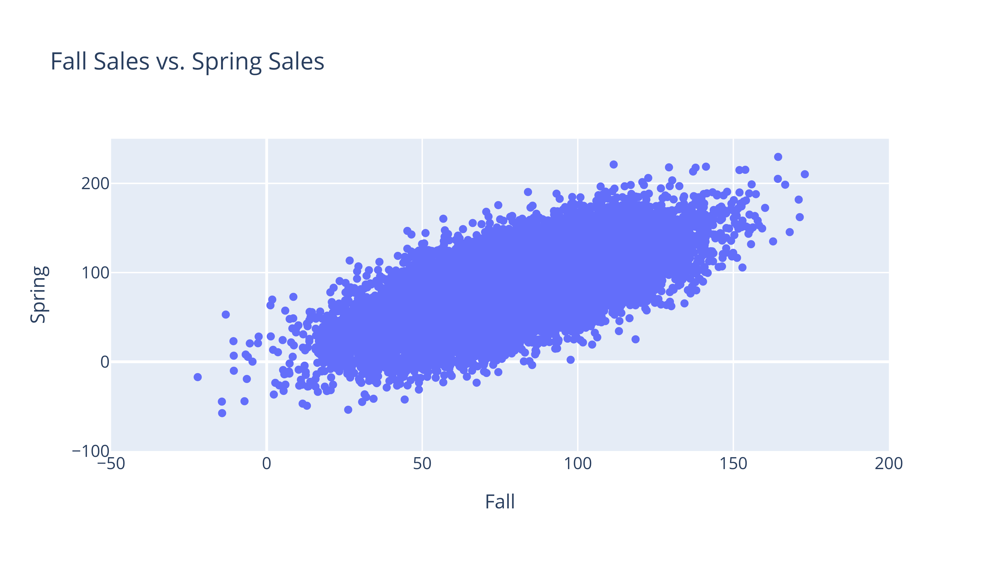

In [4]:
fig_fall_spring_sales_scatter = px.scatter(
    df_sales, x = 'Fall', y = 'Spring',
title = 'Fall Sales vs. Spring Sales').update_layout(
    xaxis_range = [-50, 200], yaxis_range = [-100, 250])
wadi(fig_fall_spring_sales_scatter, 
     'Charts/fall_spring_sales_scatter', display_type = display_type)

The 'blob' of results slopes upward, indicating that students who spent more in the fall also tended to spend more in the spring. However, we can clearly observe a great deal of variation in spring spending among students with similar fall spending patterns. Some students who spent around 100 in the fall, for instance, went on to spend roughly 200 in the spring; other students with this fall spending total hardly spent anything at the bookstore during the spring semester.

Did these spending patterns vary by college and level, however? To investigate that question, we can first create a pivot table that determines mean changes in spending by these groups.

In [5]:
df_sales_pivot = df_sales.pivot_table(
    index = ['college', 'level'], values = 'Fall_Spring_Change', 
    aggfunc = 'mean').reset_index()
df_sales_pivot['level_for_sorting'] = df_sales_pivot['level'].map(
    {'Fr':0, 'So':1, 'Ju':2, 'Se':3})
df_sales_pivot.sort_values('level_for_sorting', inplace = True)
df_sales_pivot.head()

,college,level,Fall_Spring_Change,level_for_sorting
0,STB,Fr,-10.410894,0
4,STC,Fr,-12.115880,0
12,STM,Fr,-1.225103,0
8,STL,Fr,0.107170,0
11,STL,So,-0.292982,1


We can then use Plotly to create a grouped bar chart of these results:

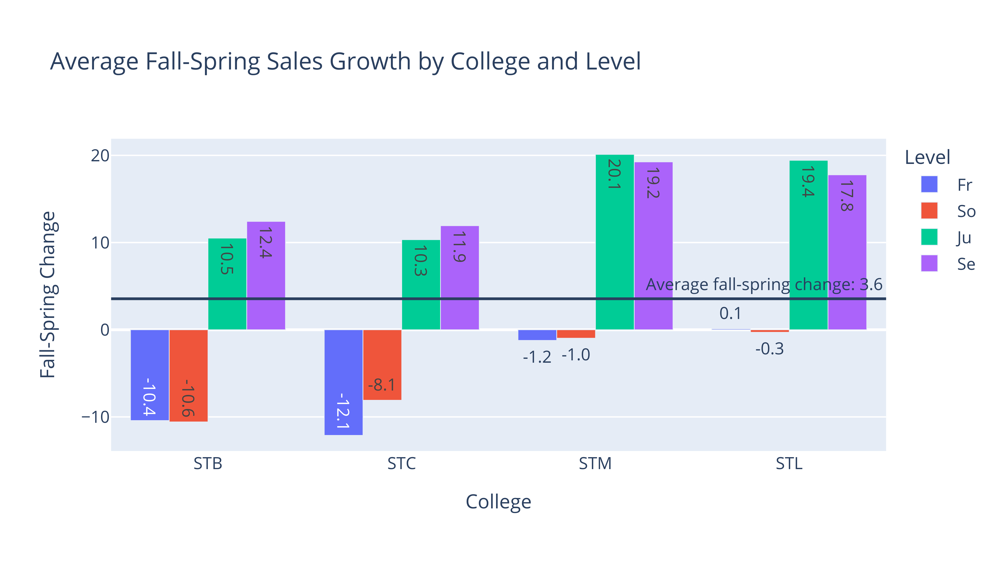

In [6]:
fig_fall_spring_sales_grouped_bar = px.bar(
    df_sales_pivot, x = 'college', y = 'Fall_Spring_Change',
      color = 'level', barmode = 'group', text_auto = '.1f',
      title = 'Average Fall-Spring Sales Growth \
by College and Level').update_layout(
    xaxis_title = 'College', yaxis_title = 'Fall-Spring Change',
legend_title = 'Level')

# Adding a reference line that displays the average fall-spring change:
avg_fall_spring_change = df_sales['Fall_Spring_Change'].mean()
fig_fall_spring_sales_grouped_bar.add_hline(y = 
                   avg_fall_spring_change,
                   annotation_text = f'Average fall-spring change: \
{round(avg_fall_spring_change, 1)}')
# For more on add_hline, 
# see https://plotly.com/python/horizontal-vertical-shapes/ . 
wadi(fig_fall_spring_sales_grouped_bar, 
     'Charts/fall_spring_sales_grouped_bar', 
     display_type=display_type)

There are some interesting patterns here. First, STL and STM appeared to have higher fall-spring spending growth than did STB and STC. This suggests that the bookstore's marketing campaign had a positive impact, but it doesn't prove it. (Some unrelated factor, unbeknownst to us, migt have driven this growth--but it's still a positive sign for the marketing team.)

Second, average spending *dropped* for freshmen and sophomores but rose for juniors and seniors. Removing unhealthy snacks from the checkout aisles may truly have depressed sales for younger students!

*(In the Graphing section of Python for Nonprofits, I suggested that you compare this chart to the histogram matrix titled 'Fall/Spring Sales Distributions by College and Level'. Both show similar sets of data, but I find this grouped bar chart to be far more intuitive.)*

### Creating a linear regression using a formula approach:

We can now use a regression in order to examine the relationship between college, gender, level, and fall sales on spring spending. Thanks to Python's powerful statsmodels library, we can set up this regression with only a few lines of code.

I'll use Statsmodels' *formula* API for this section, as it easily accommodates categorical variables. (College and gender are examples of cateogrical variables, as their values are specific points rather than a range; a student can't be 'between' STB and STL. Fall spending, on the other hand, is an example of a continuous variable). 

The formula argument in the following code instructs Statsmodels to create a regression that evaluates the impact of our four independent variables (fall spending, college, level, and gender) on our dependent variable (spring spending). 

(The documentation at https://www.statsmodels.org/stable/examples/notebooks/generated/formulas.html proved very helpful in writing this section.)

In [7]:
sales_lr_1 = smf.ols(formula = "Spring ~ Fall + college + level + gender", 
                   data = df_sales) 
sales_lr_results_1 = sales_lr_1.fit()
# sales_lr_results_1.summary()

Note: the following output could be displayed via sales_lr_results_1.summary(); however, this output was not compatible with my current Jupyter Book export setup. (See https://github.com/jupyter-book/jupyter-book/issues/2279 for more details on this error.) Therefore, I'm instead displaying screenshots of the output of my summary() function call. (I'll do the same with subsequent regression examples within this section.) (Also note that not all of these screenshots contain all Statsmodels-provided warnings that normally proceed regression statistics.)

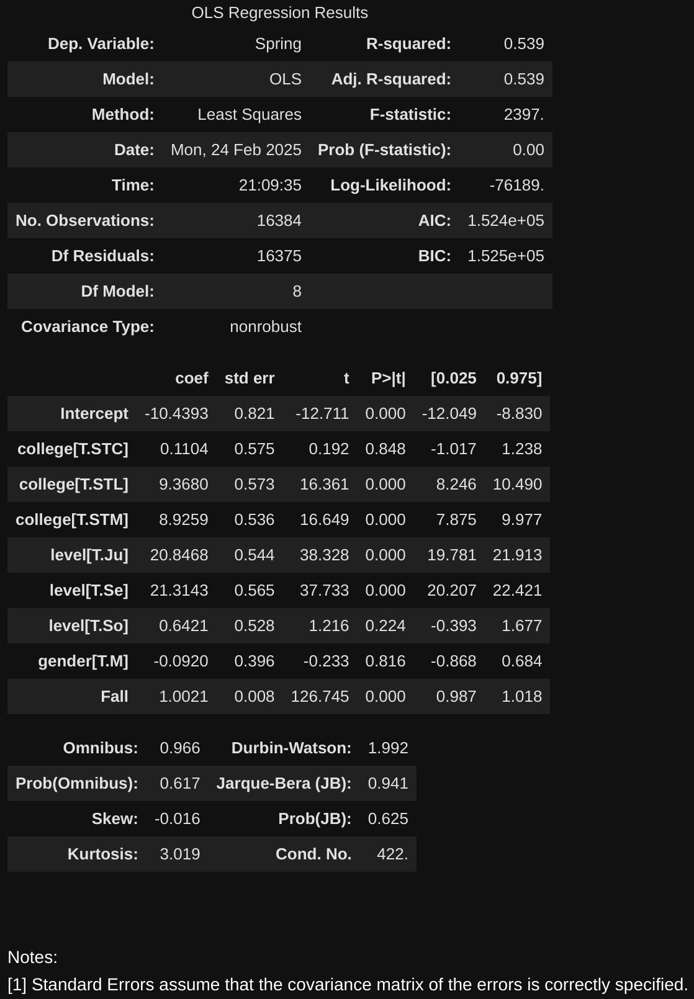

In [8]:
Image('Regression_Screenshots/sales_lr_results_1_summary.png', width = 600)

### Analyzing our first regression summary

There's a lot of output here, so I'll just focus on a few key elements.

The R-squared value at the top right suggests that 53.9% of all variance in spring spending can be explained by students' fall spending, college, gender, and level. That's a sizeable amount, though it still leaves almost half of students' spring spending patterns unexplained.

The midpoint of the regression summary contains a list of coefficients; these show the effect of each variable on spending after adjusting for all other variables. The `coeff` column displays the actual coefficients; the `[0.025` and `0.975]` columns show the 95% confidence interval for these coefficients; and the `P>|t|` column shows their p-values--i.e. the likelihood that we would have seen a coefficient of this magnitude if the actual coefficient was *not* 0.  

Note that the regression treats each college, gender, and level option as a boolean (binary) value: each respondent either belongs to that value or does not. (Meanwhile, fall spending is viewed as a continuous variable.) Thus, the `gender[T.M]` coefficient refers to male students; the `college[T.STL]` coefficient refers to STC students; and so on. 

You'll also note that, for each categorical variable, one value (F for gender, Fr for level, and STB for college) is missing from the results. This is the baseline value against which other values are compared. For example, the `college[T.STL]` coefficient of 9.368 means that, after adjusting for the other variables in our model, STL students spent around 9.37 more than STB students. Meanwhile, the `level[T.Ju]` coefficient of 20.8468 means that juniors can be expected to spend around 20.85 more than freshmen (after accounting for our other variables).

The 'Fall' variable of 1.0021 means that every dollar of fall spending is associated with slightly more than one dollar in spring spending (again, after other variables are accounted for). 

The intercept predicts what a given student's spending would be if all input values equaled 0. In this case, a student with input values of 0 would be a female freshman at STB who spent 0 dollars in the fall; this is because 'female', 'Fr' (for 'freshman'), and 'STB' are all missing from our coefficient lists, indicating that they are being treated as our baseline. 

Our p-values can help us determine which variables have a significant relationship with spending and which do not. The 0.816 p-value for the `gender[T.M]` variable, for instance, suggests that male students' spring spending didn't differ significantly from female students', even though women did spend slightly more than men. Our list of p-values also reveals that STL and STM students did spend significantly more than STB students, but STC students did not. (This suggests that the bookstore's marketing campaign had a significant positive impact on STL and STM spending--and that the management should consider launching this same campaign at STB and STC also.) Finally, we can see that juniors and seniors, but not sophomores, had significantly higher spending than freshmen. This gives us further evidence (but not proof) that the unhealthy snacks the bookstore phased out *had* indeed drawn in traffic from younger students!

### Using these regression results to make predictions

Now that we have our regression coefficients, we can use them to make predictions about spring spending patterns. (There are two issues with the simplified approach I'm showing here. First, we don't really *need* to make predictions because we have actual spring spending data for everyone at NVCU. And second, a more robust approach would be to create a 'training' and 'test' dataset; bulid our model only off the former; and then test it on the latter. However, to keep this section simple, I'm using the same dataset for both my training and testing procedures.)

Let's try predicting the spring sales of the student whose ID is 2020-1:

In [9]:
df_sales.query("student_id == '2020-1'").drop('Spring', axis = 1)

,student_id,gender,college,level,Fall,Fall_Spring_Change
0,2020-1,F,STC,Se,66.8,-8.56


This is a female senior at STC who spent 66.80 at the bookstore in the fall. According to our model, how much could we have expected her to spend in the spring?

We can predict her spring spending total by starting with the intercept (which, as mentioned earlier, represents a female STB freshman who spent 0 dollars in the fall); adding the product of our Fall coefficient and 66.8; and then adding the value of the STC and Senior (Se) coefficients. Here's what that total amounts to:

In [10]:
# Note that you can retrieve each regression coefficient via 
# the regression results' params attribute.
(sales_lr_results_1.params['Intercept'] 
 + sales_lr_results_1.params['Fall'] * 66.8 
 + sales_lr_results_1.params['college[T.STC]']
 + sales_lr_results_1.params['level[T.Se]'])

np.float64(77.92859960593265)

As shown below, however, this student's actual spring spending was only 58.24, so the model overshot here by nearly 20 dollars.

In [11]:
df_sales.query("student_id == '2020-1'").iloc[0]

student_id            2020-1
gender                     F
college                  STC
level                     Se
Fall                    66.8
Spring                 58.24
Fall_Spring_Change     -8.56
Name: 0, dtype: object

We can easily generate predictions for all rows within df_sales by using the results' `predict` method. (These predictions would be particularly useful for a new set of data for which we don't yet have our actual results.) Note that the value of our first prediction (for the student with an ID of 2020-1) matches the one calculated above.

In [12]:
df_sales['Predictions'] = sales_lr_results_1.predict(
    df_sales[['Fall', 'gender', 'college', 'level']])
df_sales

,student_id,gender,college,...,Spring,Fall_Spring_Change,Predictions
0,2020-1,F,STC,...,58.24,-8.56,77.928600
1,2020-2,F,STM,...,151.90,47.23,124.695205
2,2020-3,F,STC,...,16.56,-29.61,57.254379
3,2020-4,F,STC,...,73.77,15.09,69.791194
...,...,...,...,...,...,...,...
16380,2023-5440,M,STM,...,50.37,-9.58,58.473027
16381,2023-5441,M,STL,...,43.60,-27.97,70.560045
16382,2023-5442,M,STB,...,38.29,-62.23,90.204115
16383,2023-5443,M,STM,...,29.43,-28.02,55.967668


Now that we've added all of our predictions, we can compare them to our actual results via a scatter plot:

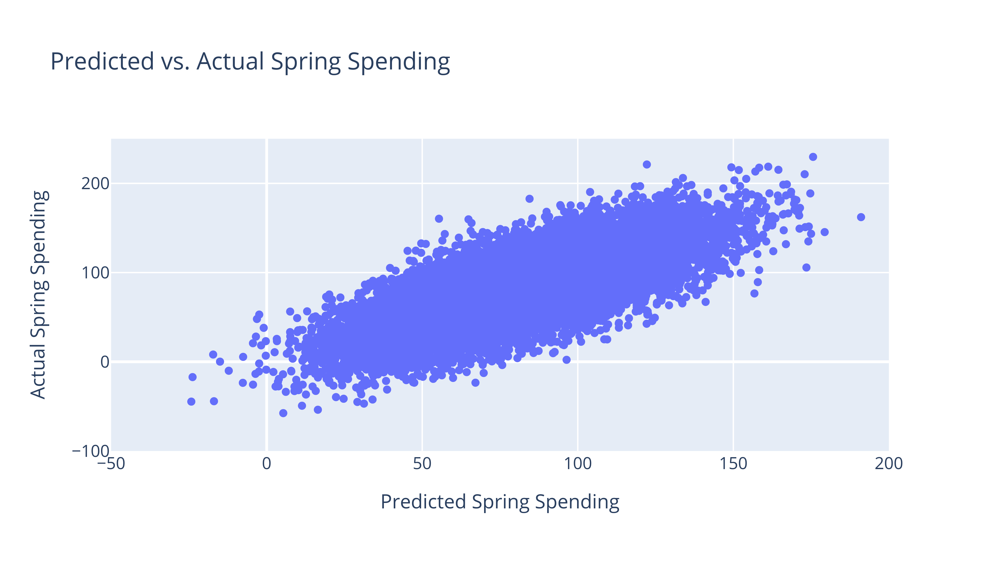

In [13]:
fig_spring_predictions_vs_actual = px.scatter(
    x = df_sales['Predictions'], y = df_sales['Spring'],
title = 'Predicted vs. Actual Spring Spending').update_layout(
    xaxis_title = 'Predicted Spring Spending', 
    yaxis_title = 'Actual Spring Spending',
xaxis_range = [-50, 200], yaxis_range = [-100, 250])
wadi(fig_spring_predictions_vs_actual, 
'Charts/spring_predictions_vs_actual', display_type = display_type)

If you compare this graph to our 'Spring Sales as Function of Fall Sales' scatter plot, you'll find (perhaps after squinting for a bit) that our new chart's y axis values are clustered a bit more closely together. (I made the two easier to compare by setting the same x and y axis ranges for each.) This makes sense, as our first chart took only fall sales into account; this new chart also considers the impact of college, level, and gender, and thus can make more accurate predictions of spring spending.)

### Checking the normality of our residuals

For a linear regression to be valid, certain criteria need to be met. Helpful overviews of these assumptions can be found at https://ethanweed.github.io/pythonbook/05.04-regression.html#assumptions-of-regression and at https://www.kirenz.com/blog/posts/2021-11-14-linear-regression-diagnostics-in-python/ . In addition, a list of Statsmodels functions for testing regression assumptions is available at https://www.statsmodels.org/stable/diagnostic.html .

As noted in the introduction, this chapter won't provide a detailed overview of all of these assumptions; however, if you plan to implement regressions in a professional setting, I strongly recommend that you look into these criteria and their corresponding tests. In the following cells, I'll check just one assumption: that the residuals of our regression are normally distributed.

We can visualize the distribution of our residuals via a histogram: (setting histnorm to 'probability density' will make this chart more compatible with a normal distribution curve that we'll add on top of it.)

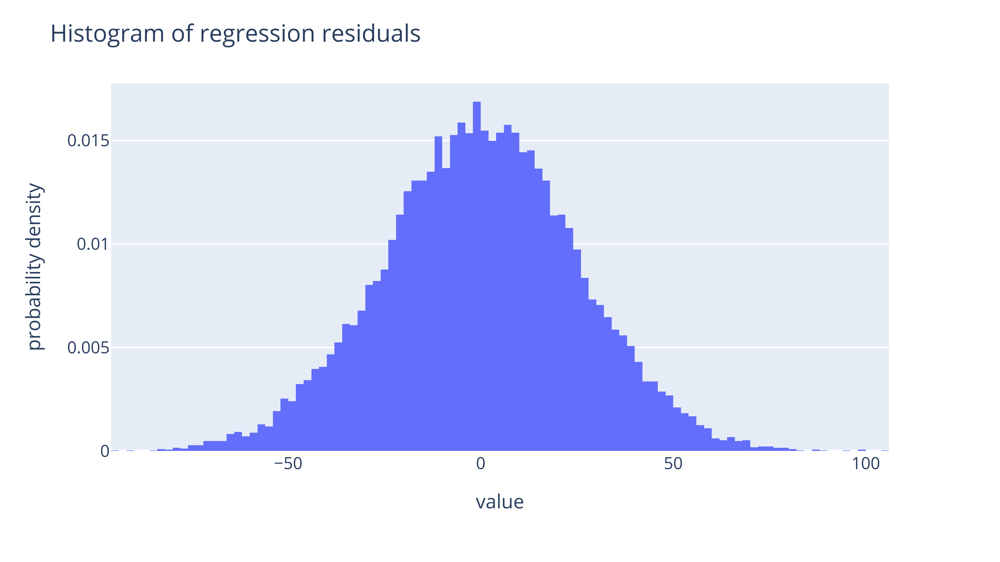

In [14]:
fig_sales_residual_hist = px.histogram(
    sales_lr_results_1.resid, 
    histnorm = 'probability density').update_layout(
    showlegend = False, title = 'Histogram of regression residuals')
wadi(fig_sales_residual_hist, 'Charts/sales_residual_hist',
    display_type = display_type)

Let's compare this distribution to a plot of a standard normal distribution. To visualize this normal distribution, we'll first create a DataFrame that has a similar range of x values (-100 to 100) as the histogram above. This DataFrame's y values will be based on the normal distribution's probability density function; the standard deviation used within this function will match that of our residuals.

I converted the code for creating our normal distribution DataFrame into a function so that I could reuse it later in this section.

In [15]:
def gen_normdist(min, max, rows = 1000, mean = 0, stdev = 1):
    '''This function creates a DataFrame that 
    can be used to plot a normal distribution. The 'y' field within
    this DataFrame will show the normal distribution function's
    output for each 'x' field.
    
    min and max: the minimum and maximum x values to include within
    the DataFrame.

    rows: the number of rows to include within the DataFrame. Higher
    numbers will result in smoother plots.

    mean and stdev: the mean and standard deviation to use within the
    normal distribution function.
    '''
    df_normdist = pd.DataFrame(
        data={'x':np.linspace(min, max, rows+1)})
    # The code above uses np.linspace to list 'rows' values of x that range
    # from 'min' to 'max' (inclusive). For more on this function, see:
    # https://numpy.org/doc/stable/reference/generated/numpy.linspace.html
    
    df_normdist['y'] = (
    1/math.sqrt(2*math.pi*(stdev**2)))*math.e**(
        (-1*(df_normdist['x'] - mean)**2) / (2*stdev**2))
    # This code is based on the function found at
    # https://en.wikipedia.org/wiki/Normal_distribution
    return df_normdist

In [16]:
df_normdist = gen_normdist(
    min = -100, max = 100, 
    mean =0, stdev = np.std(sales_lr_results_1.resid))
df_normdist

,x,y
0,-100.0,0.000006
1,-99.8,0.000007
2,-99.6,0.000007
3,-99.4,0.000007
...,...,...
997,99.4,0.000007
998,99.6,0.000007
999,99.8,0.000007
1000,100.0,0.000006


We'll graph these x and y values using px.line():

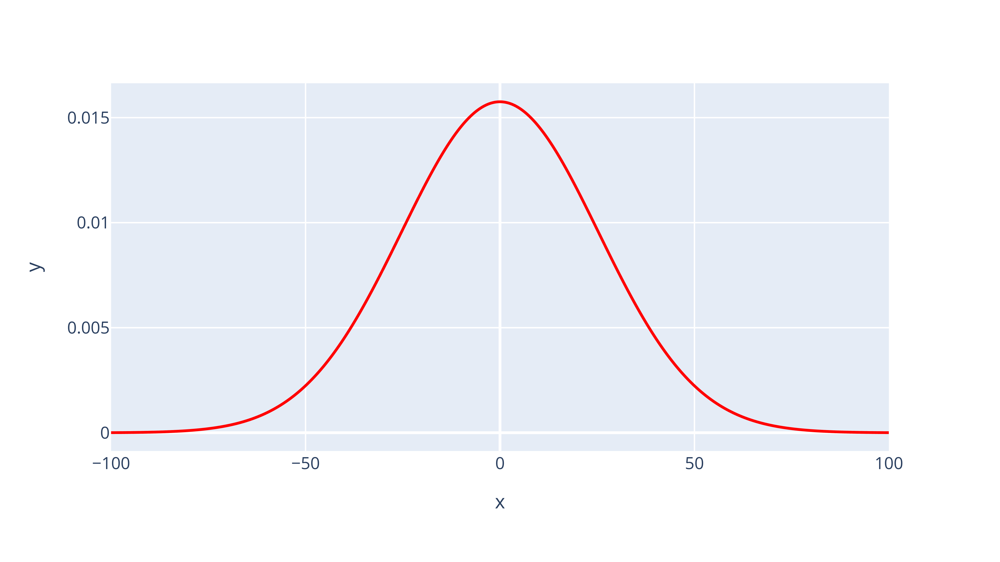

In [17]:
fig_normdist = px.line(df_normdist, x = 'x', y = 'y',
                      color_discrete_sequence = ['red'])
wadi(fig_normdist, 'Charts/normal_distribution_plot',
    display_type = display_type)

We can now add this curve directly onto our regression residuals plot via add_trace(). (This code was based on Shaunak Sen's StackOverflow response at https://stackoverflow.com/a/66891500/13097194 .) We'll also update our title to reflect our addition.

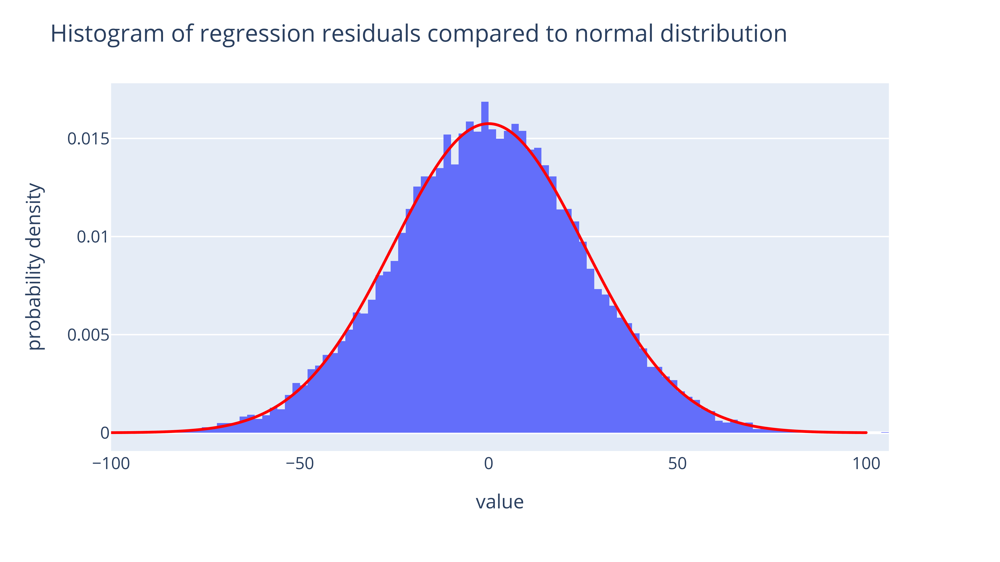

In [18]:
fig_sales_residual_hist.add_trace(
    fig_normdist['data'][0]).update_layout(
    title= 'Histogram of regression residuals compared to normal \
distribution')
wadi(fig_sales_residual_hist, 'Charts/sales_residual_hist_vs_normdist',
    display_type = display_type)

Our residuals graph aligns very closely to this normal distribution plot. For a more precise test, though, we can incorporate Statsmodels' `omni_normtest` function:

In [19]:
sms.omni_normtest(sales_lr_results_1.resid)

NormaltestResult(statistic=np.float64(0.9660949405011305), pvalue=np.float64(0.6169005382553423))

This p-value is above 0.05, which suggests that our residuals are indeed normally distributed. 

If you glance back at our regression output, you'll see that these two numbers (0.966 and 0.617) match the 'Omnibus': and 'Prob(Omnibus):' rows near the bottom. In other words, Statsmodels performs this test for you when you run your regression--thus saving you the trouble of running it yourself.

What sort of results would we get if our residuals did not match the normal distribution so well? Let's find out! The following cell creates a 'skewed' set of these residuals by multiplying all positive values by 2, then visualizes them using a histogram:

In [20]:
skewed_resids = [resid * 2 if resid > 0 else resid \
for resid in sales_lr_results_1.resid]

fig_skewed_resids = px.histogram(
    skewed_resids,
    histnorm = 'probability density',
title = 'Example of non-normally-distributed regression residuals')
fig_skewed_resids
wadi(fig_skewed_resids, 'Charts/skewed_residuals')

We'll now rerun our omni_normtest:

In [21]:
sms.omni_normtest(skewed_resids)

NormaltestResult(statistic=np.float64(1347.574679202082), pvalue=np.float64(2.3871320020229674e-293))

This p value is incredibly small, indicating that our residuals are *not* normally distributed.

### Comparing fall sales between colleges

In the introduction, we discussed the whether the difference in fall STB and STL sales was statistically significant. We can now use a linear regression to find out.

First, we'll evaluate fall sales for each college, then determine how much higher STB's sales were than STL's.

In [22]:
df_fall_sales = df_sales.pivot_table(index = 'college',
                     values = 'Fall',
                     aggfunc = 'mean').reset_index()
df_fall_sales

,college,Fall
0,STB,80.281666
1,STC,80.201572
2,STL,79.691695
3,STM,80.153226


Calculating and reporting the nominal and % differences in fall sales between STL and STB:

In [23]:
fall_stb_sales = df_fall_sales.query("college == 'STB'").iloc[0]['Fall']
fall_stl_sales = df_fall_sales.query("college == 'STL'").iloc[0]['Fall']
stl_stb_nominal_diff = round(fall_stl_sales - fall_stb_sales, 2)
stl_stb_pct_diff = (round(100*(fall_stl_sales/fall_stb_sales-1), 2))
print(f"STB's average fall sales were {stl_stb_pct_diff}% lower (and \
{stl_stb_nominal_diff} lower in nominal terms) than were STL's.")

STB's average fall sales were -0.73% lower (and -0.59 lower in nominal terms) than were STL's.


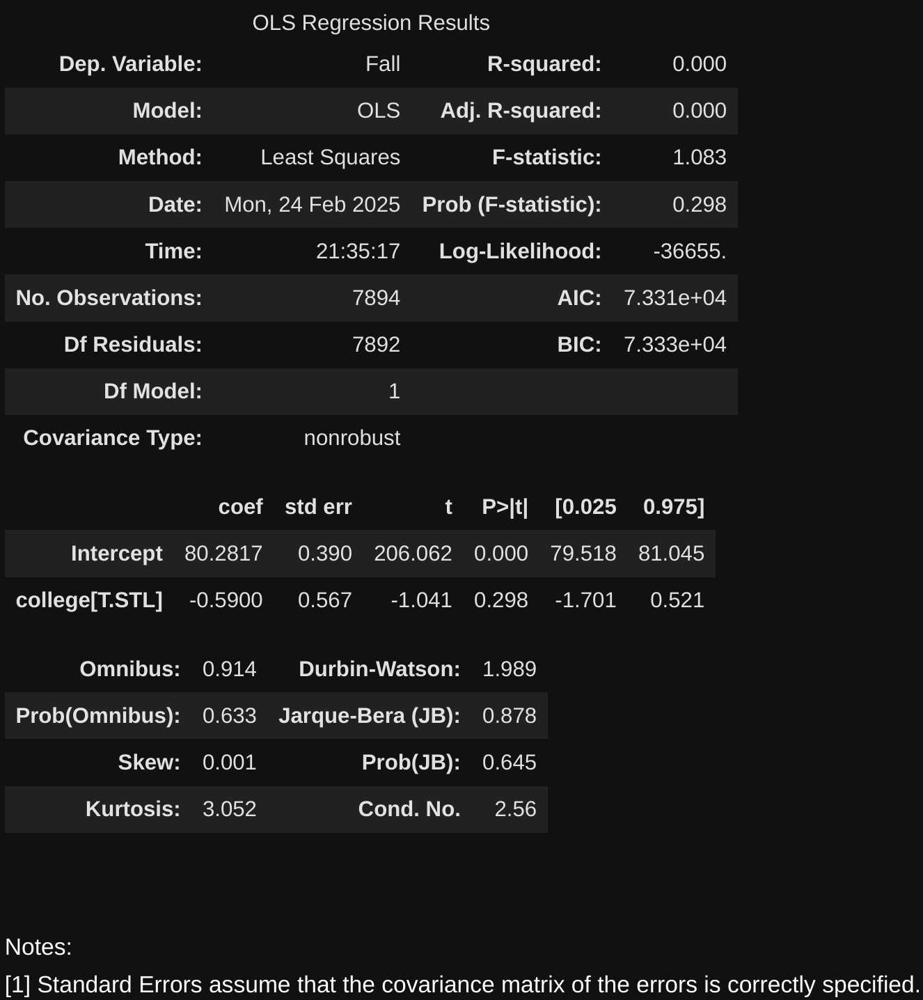

In [24]:
sales_lr_2 = smf.ols(formula = "Fall ~ college", 
                   data = df_sales.query("college in ['STL', 'STB']")) 
sales_lr_results_2 = sales_lr_2.fit()
# sales_lr_results_2.summary()
Image('Regression_Screenshots/sales_lr_results_2_summary.png', width = 600)

Note that the intercept matches the fall STB spending that we calculated earlier; that's because it indeed reflects fall STB spending. In addition, the STL coefficient matches the nominal difference in spending between STL and STB that we calculated earlier.

Our p-value is 0.298, which is well above the 0.05 signifciance threshold that we're using within this project. Thus, we'll conclude here that there was not a significant difference in fall spending between these two colleges.

### Comparing these results to those of a t-test

If you have a background in statistics, you may be familiar with t-tests (https://en.wikipedia.org/wiki/Student's_t-test). Because our comparison of STL's and STB's fall spending includes two distinct sets of means, we could also have used an independent-samples t-test to determine whether they were statistically significant. That's exactly what the following cell does:

In [25]:
tstat, pvalue, dof = ttest_ind(
    x1 = df_sales.query("college == 'STL'")['Fall'], 
    x2 = df_sales.query("college == 'STB'")['Fall'])
# This code was based on the example shown at
# https://www.statsmodels.org/stable/generated/statsmodels.stats.
# weightstats.ttest_ind.html#statsmodels.stats.weightstats.ttest_ind
print("T statistic:",tstat, "\np-value:",pvalue)

T statistic: -1.0407829313964725 
p-value: 0.2980081862689233


Note that the T statistic and p-value reported here match those for the STL coefficient in our regression model.


## Part 2: Evaluating the relationship between bachelor's degree prevalence and median incomes

Now that we've tried out regression models on simulated data, let's have a look at some real-world data. As explained back in the Census Data Imports section, NVCU's admissions department wishes to demonstrate that getting a bachelor's degree is, on average, a financial benefit to college graduates. 

Therefore, we retrieved American Community Survey data within that section that showed (1) median earnings for all residents aged 25 or older *and* (2) the percentage of residents who had a bachelor's degree. If these two metrics are positively correlated, that will boost the admissions department's case that going to college can help boost individuals' future earnings.* We'll now create regression models that evaluate whether there's a significant relationship between these two variables.

**This is a flawed approach to demonstrating the financial benefits of a bachelor's degree: after all, the mere fact that median incomes are positively correlated with the percentage of residents who have a 4-year degree does *not* conclusively prove that bachelor's-degree holders earn more than high-school graduates. The latter group might earn just as much, or even more, than the former! However, I included this analysis so that I could show a real-world example of a regression model with continuous independent and dependent variables. Later in this section, I'll provide an additional model that directly compares bachelor's and high-school-degree earnings.*

### Importing our county-level education and income dataset

In [26]:
df_cmib = pd.read_csv(
    '../Census_Data_Imports/Datasets/education_and_earnings_county.csv')
# 'cmib' is short for 'county median incomes and bachelor's degrees'.
# Simplifying our dataset by removing extraneous fields:

df_cmib.drop(['Year', 'state', 'county'], axis = 1, inplace = True)
# Limiting our output to counties in one of the 50 US states (plus DC):
df_cmib.query("State_Abbrev != 'PR'", inplace = True)
df_cmib[['NAME', 'Median_Earnings_for_Total_25plus_Population',
'Pct_With_Bachelors_Degree']]


,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree
0,"Autauga County, Alabama",47719,28.282680
1,"Baldwin County, Alabama",47748,32.797637
2,"Barbour County, Alabama",34557,11.464715
3,"Bibb County, Alabama",34001,11.468207
...,...,...,...
3140,"Teton County, Wyoming",55463,61.219716
3141,"Uinta County, Wyoming",43883,21.319190
3142,"Washakie County, Wyoming",42474,22.032358
3143,"Weston County, Wyoming",47865,18.043478


### Cleaning our dataset

Our dataset includes not only median earnings for all county residents, but earnings for specific education levels also. Let's take a look at these averages (the 'mean of the medians', if you will):

In [27]:
median_earnings_cols = ['Median_Earnings_for_Total_25plus_Population',
                       'Median_Earnings_Less_Than_HS',
                        'Median_Earnings_HS',
                        'Median_Earnings_Some_College',
                        "Median_Earnings_Bachelors_Degree",
                        "Median_Earnings_Postgraduate"]
df_cmib[median_earnings_cols].mean()

Median_Earnings_for_Total_25plus_Population   -3.794012e+05
Median_Earnings_Less_Than_HS                  -4.089420e+07
Median_Earnings_HS                            -3.779011e+06
Median_Earnings_Some_College                  -1.653628e+06
Median_Earnings_Bachelors_Degree              -4.396728e+06
Median_Earnings_Postgraduate                  -1.795533e+07
dtype: float64

Well, these number don't seem right--they're all negative! What's going on?

The issue here is that the number -666,666,666 is getting used as a code for missing income statistics. The presence of this giant negative number within our dataset is dramatically skewing our average calculations.

You can identify this number by calling .min() on the dataset's median income columns:

In [28]:
df_cmib[median_earnings_cols].min()

Median_Earnings_for_Total_25plus_Population   -666666666
Median_Earnings_Less_Than_HS                  -666666666
Median_Earnings_HS                            -666666666
Median_Earnings_Some_College                  -666666666
Median_Earnings_Bachelors_Degree              -666666666
Median_Earnings_Postgraduate                  -666666666
dtype: int64

I also looked for other unusually small values that might represent additional codes for invalid data, but I didn't find any:

In [29]:
for col in median_earnings_cols:
    print(df_cmib.sort_values(col)[col].unique())

[-666666666      19366      23388 ...      96611      97482     106932]
[-666666666       2499       3417 ...      87929     105764     128554]
[-666666666      13961      15238 ...      75434      84750      88493]
[-666666666      16806      17040 ...      90183      93458     100365]
[-666666666       2499      18963 ...     110960     115313     158333]
[-666666666       2499      13750 ...     154872     164519     250001]


I'll now remove invalid 'Median_Earnings_for_Total_25+_Population' entries from our dataset by filtering out rows with *negative* values. (I could have only filtered out rows with entries of -666666666, but that code would fail to work for future versions of this dataset if the Census Bureau happened to replace that number with a different one.)

Since the only earnings row that we'll be using in our dataset is the 'Median_Earnings_for_Total_25+_Population' one, I won't filter out invalid numbers in other columns just yet, as that would cause many rows with valid 'Median_Earnings_for_Total_25+_Population' entries to get removed.

In [30]:
df_cmib.query("`Median_Earnings_for_Total_25plus_Population` >= 0", 
              inplace = True)
# Enclosing this field in backticks helped query() correctly parse it.

# Confirming that we removed all -666666666 values from our overall
# median earnings column:
df_cmib[['NAME', 'Median_Earnings_for_Total_25plus_Population',
'Pct_With_Bachelors_Degree']].sort_values(
    'Median_Earnings_for_Total_25plus_Population').head(5)

,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree
2593,"Edwards County, Texas",19366,25.921909
1113,"Wolfe County, Kentucky",23388,7.393428
571,"Custer County, Idaho",23782,25.196424
2548,"Brooks County, Texas",24585,14.440783
285,"Mineral County, Colorado",24783,54.532164


As in the first section, we'll visualize our data before incorporating it into a model. The following scatter plot shows how the prevalence of bachelor's degrees correlates with median earnings. The dots are also color-coded by region to help us identify any regional patterns that might be present.

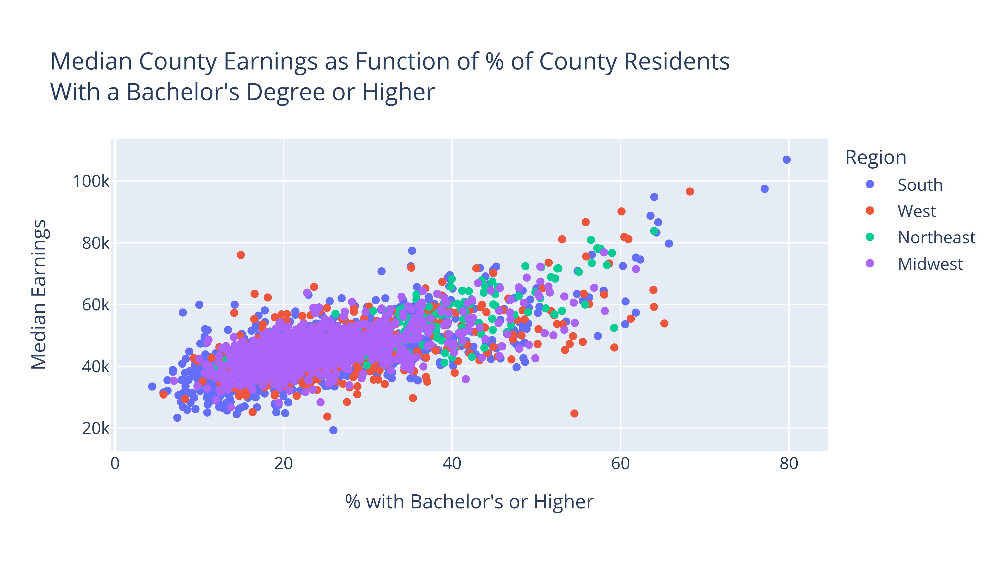

In [31]:
fig_ba_pct_earnings_scatter = px.scatter(
    df_cmib, x = "Pct_With_Bachelors_Degree", 
           y = 'Median_Earnings_for_Total_25plus_Population',
           color = 'Region', hover_data = 'NAME',
title = "Median County Earnings as Function of % of County \
Residents<br>With a Bachelor's Degree or Higher").update_layout(
    xaxis_title = "% with Bachelor's \
or Higher", yaxis_title = "Median Earnings")
# Note the use of <br>, a piece of HTML code, in the title to add in 
# a line break. For more documentation on applying HTML code within
# Plotly text elements, visit 
# https://plotly.com/chart-studio-help/adding-HTML-and-links-to-charts/ . 
# (This page is meant for Plotly's paid Chart Studio offering, but 
# many or all of the HTML items will also work within free Plotly
# graphs.)
wadi(fig_ba_pct_earnings_scatter, 'Charts/county_ba_pct_earnings_scatter',
     display_type = display_type)

I'm seeing a hint of a curve in the above scatter plot. Therefore, in order to allow our model to better account for this curve, I'll add in a squared version of the 'Pct_With_Bachelors_Degree' column. 

In [32]:
df_cmib['Pct_With_Bachelors_Degree_Squared'] = df_cmib[
'Pct_With_Bachelors_Degree']**2

### Building our first regression model

This model will use both the original and squared versions of our bachelor's degree prevalence field in order to predict median earnings. (This is because I found both of these elements to have a statistically significant relationship with our earnings values.)

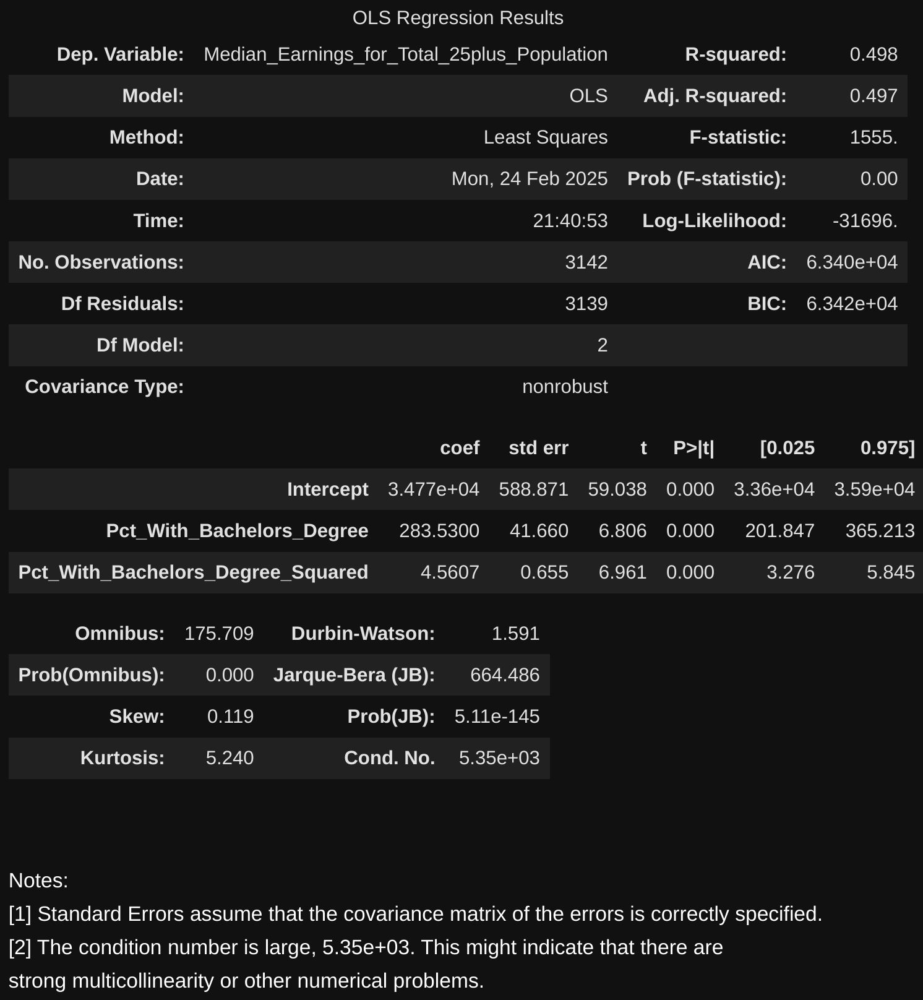

In [86]:
cmib_lr_1 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree + \
Pct_With_Bachelors_Degree_Squared", 
                   data = df_cmib) 
cmib_lr_results_1 = cmib_lr_1.fit()
# cmib_lr_results_1.summary()
Image('Regression_Screenshots/cmib_lr_results_1_summary.png', width = 550)

Our R-squared value is close to 0.5, indicating that the prevalence of bachelor's degrees explains roughly half of all variation in county-level incomes.

Next, let's create a revised version of this regression model that also takes counties' regional settings into account.

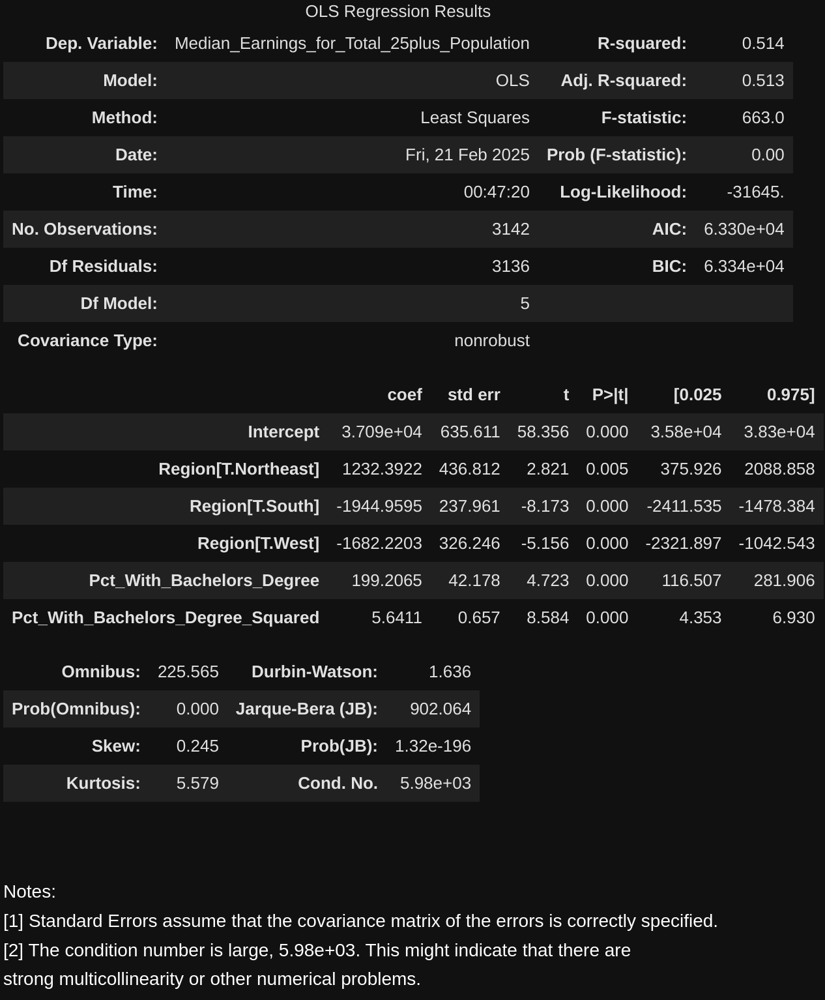

In [34]:
cmib_lr_2 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree + \
Pct_With_Bachelors_Degree_Squared + Region", 
                   data = df_cmib) 
cmib_lr_results_2 = cmib_lr_2.fit()
# cmib_lr_results_2.summary()
Image('Regression_Screenshots/cmib_lr_results_2_summary.png', width = 600)

Each region-level predictor is significant as well. (Note that, because 'Region' is a categorical variable, each region (aside from the baseline midwest value) is listed as a separate coefficient; these coefficients show how much more (or less) each region's median earnings are after adjusting for our bachelor's-degree fields.)

Next, we'll examine the difference between our predicted and actual county-level median incomes. (Instead of using `predict()` to generate our predicted values, we'll simply retrieve these from the `fittedvalues` attribute of our regression results. Similarly, we'll source our regression residuals from our results' `resid` attribute.)

In [35]:
df_cmib_pred_vs_actual = df_cmib.copy()[['NAME', 
'Median_Earnings_for_Total_25plus_Population',
'Pct_With_Bachelors_Degree', 'Pct_With_Bachelors_Degree_Squared', 
'Region']].copy()

# Displaying the model's predictions for each county:
df_cmib_pred_vs_actual['Pred_Val'] = cmib_lr_results_2.fittedvalues
# Source of this attribute:
# https://www.statsmodels.org/dev/generated/statsmodels.regression.
# linear_model.OLSResults.html
# Note: we could also have generated these values using the following
# code:
# df_cmib_pred_vs_actual['Pred_Val'] = cmib_lr_results_2.predict(
#     df_cmib_pred_vs_actual[
#     ['Pct_With_Bachelors_Degree',
#      'Pct_With_Bachelors_Degree_Squared', 'Region']])

# Displaying our model's errors for each county:
df_cmib_pred_vs_actual['Actual-Pred'] = cmib_lr_results_2.resid
# We could also have calculated these using the following code:
# df_cmib_pred_vs_actual['Actual-Pred'] = (
#     df_cmib_pred_vs_actual[
#     'Median_Earnings_for_Total_25plus_Population'] - 
#     df_cmib_pred_vs_actual['Pred_Val'])


df_cmib_pred_vs_actual.sort_values(
    'Actual-Pred', ascending = False).head(5)

,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree,Pct_With_Bachelors_Degree_Squared,Region,Pred_Val,Actual-Pred
87,"North Slope Borough, Alaska",76090,14.927417,222.827783,West,39640.377288,36449.622712
1198,"Calvert County, Maryland",77471,35.262776,1243.463362,South,49186.122657,28284.877343
2874,"Loudoun County, Virginia",94853,64.013746,4097.759728,South,71014.991163,23838.008837
1202,"Charles County, Maryland",70792,31.637943,1000.959444,South,47096.033650,23695.966350
1212,"St. Mary's County, Maryland",72426,35.100217,1232.025268,South,49089.216077,23336.783923


The table above shows the five counties whose median incomes our model underestimated the most. The first county equivalent within this list (North Slope Borough, AK) has a median income of 76,090-around 36,449 higher than would be predicted using its Region (West) and bachelor's degree-prevalence (14.92%) only. My guess is that many workers in this county without college degrees are highly-paid oil and natural gas workers, which would explain why its median income is higher than expected.

Next, we'll visualize our predicted and actual earnings. If our R-squared were 100, all of these points would exist on the same line. However, becasue our R-squared was only 0.514, we can see plenty of variation in actual median earnings for most predicted medians.

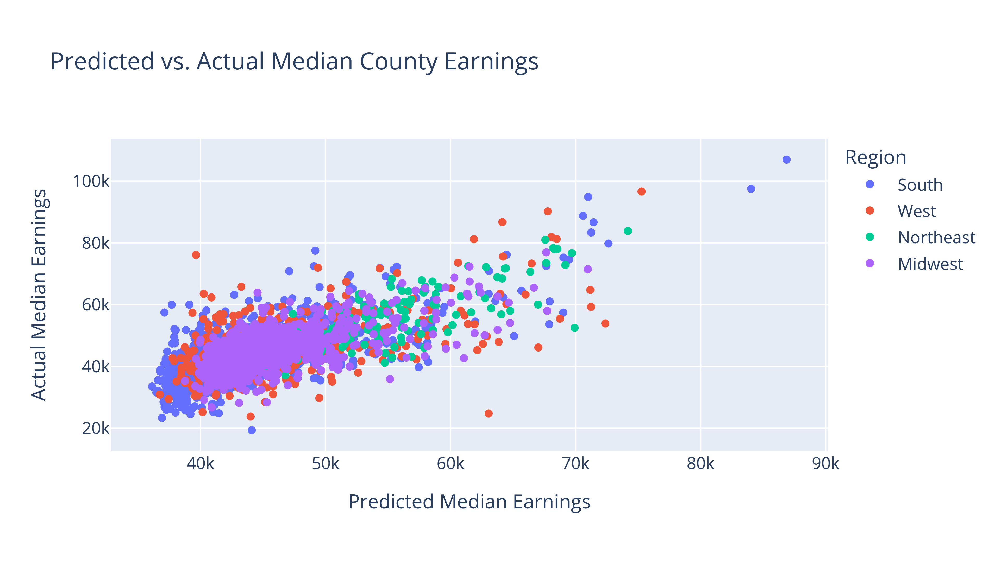

In [36]:
fig_cmib_pred_vs_actual = px.scatter(
    df_cmib_pred_vs_actual, x = 'Pred_Val', 
           y = 'Median_Earnings_for_Total_25plus_Population', 
           color = 'Region',
          hover_data = 'NAME', title = "Predicted vs. Actual Median \
County Earnings").update_layout(
    xaxis_title = 'Predicted Median Earnings', 
    yaxis_title = 'Actual Median Earnings')
wadi(fig_cmib_pred_vs_actual, 'Charts/cmib_pred_vs_actual',
     display_type=display_type)

Finally, we'll compare a histogram of our residuals to a representative normal distribution:

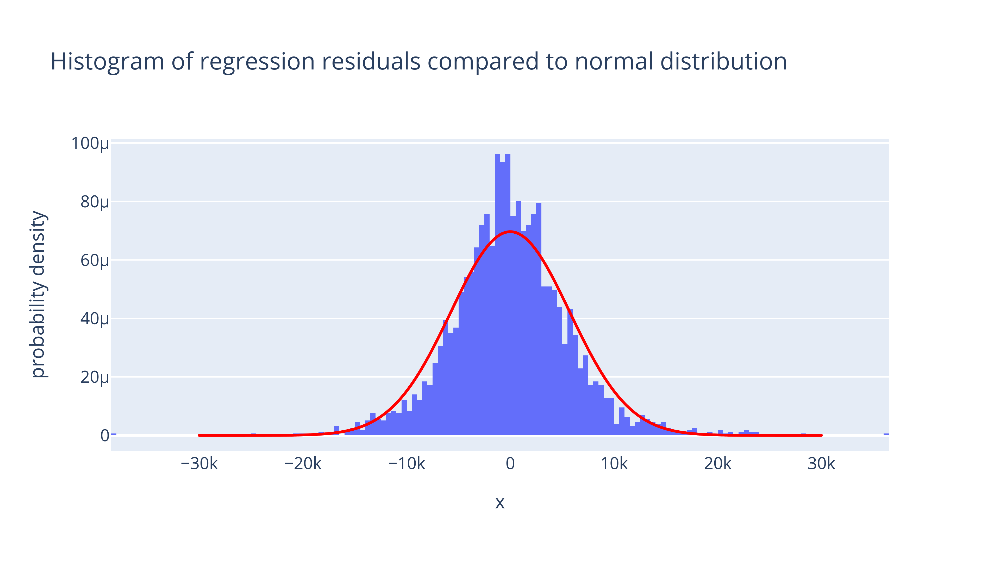

In [37]:
fig_cmib_hist = px.histogram(
    x = cmib_lr_results_2.resid, 
    title = 'Histogram of regression residuals compared to \
normal distribution',
histnorm = 'probability density')

# Adding a normal distribution line: 
# (Unlike in the earlier section, we'll generate the DataFrame for our 
# normal distribution *and* its corresponding line chart in the same
# line that adds this chart to our histogram. This saves a few lines
# of code but does make the output a bit less readable.)

fig_cmib_hist.add_trace(
    px.line(gen_normdist(
    min = -30000, max = 30000, rows = 1000,
    mean = 0, stdev = np.std(cmib_lr_results_2.resid)),
       x = 'x', y = 'y', color_discrete_sequence = ['red'])['data'][0])

wadi(fig_cmib_hist, 'Charts/cmib_residual',
     display_type=display_type)


The central section of our histogram is notably higher than the corresponding normal distribution line, which suggsts that our residuals are not normally distributed. The following omni_normtest agrees with this conclusion:

In [38]:
sms.omni_normtest(cmib_lr_results_2.resid)

NormaltestResult(statistic=np.float64(225.5648729751166), pvalue=np.float64(1.0452259364221645e-49))

### Performing state-level regressions

We'll now perform a similar set of analyses at the state, rather than county, level.

In [39]:
df_smib = pd.read_csv(
    '../Census_Data_Imports/Datasets/education_and_earnings_state.csv')
# Limiting our output to counties in one of the 50 US states (plus DC):
df_smib.query("State_Abbrev not in ['PR']", inplace = True)
df_smib.drop(['Year', 'state'], axis = 1, inplace = True)

df_smib[['NAME', 'Median_Earnings_for_Total_25plus_Population',
'Pct_With_Bachelors_Degree']].head()


,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree
0,Alabama,45197,27.755139
1,Alaska,56492,31.242276
2,Arizona,49333,32.610332
3,Arkansas,42450,25.111375
4,California,54437,36.503058


Confirming that no median earnings columns within our state-level dataset contain the invalid entries that we saw in our county-level file:

In [40]:
df_smib[median_earnings_cols].min()

Median_Earnings_for_Total_25plus_Population    41331
Median_Earnings_Less_Than_HS                   26749
Median_Earnings_HS                             33805
Median_Earnings_Some_College                   38500
Median_Earnings_Bachelors_Degree               52657
Median_Earnings_Postgraduate                   64563
dtype: int64

Visualizing the relationship between bachelor's-degree prevalence and median earnings at the state level:

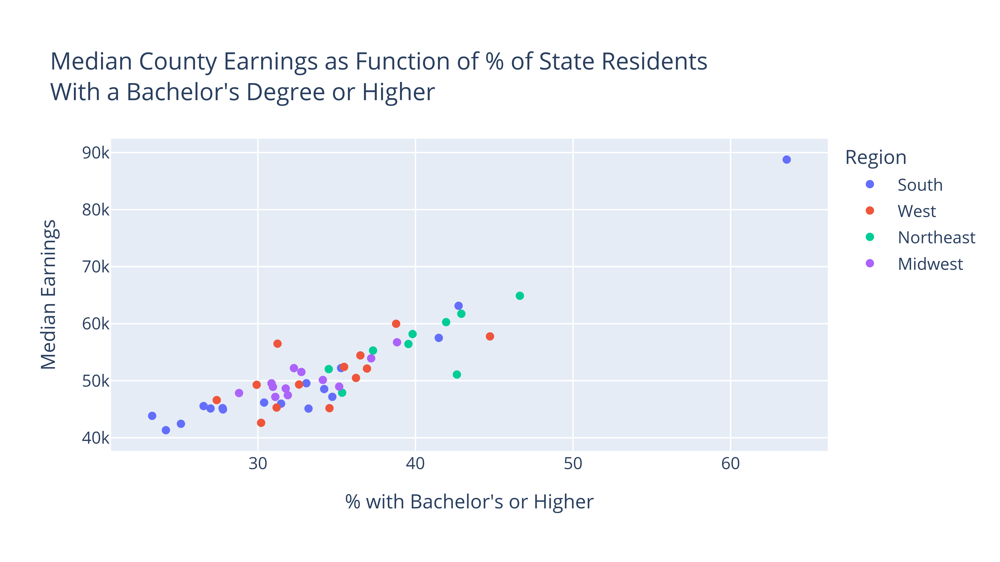

In [41]:
fig_smib_scatter = px.scatter(
    df_smib, x = "Pct_With_Bachelors_Degree", 
           y = 'Median_Earnings_for_Total_25plus_Population',
           color = 'Region', hover_data = 'NAME',
    title = "Median County Earnings as Function of % of State \
Residents<br>With a Bachelor's Degree or Higher").update_layout(
    yaxis_title = 'Median Earnings', xaxis_title = "% with Bachelor's \
or Higher")
wadi(fig_smib_scatter, 'Charts/state_ba_pct_earnings_scatter',
     display_type = display_type)

DC has a far higher median income *and* percentage of residents with bachelor's degrees than any state. Therefore, as it constitutes an outlier, I'll go ahead and remove it from our dataset (though one could also make a solid argument for keeping it in).

In [42]:
df_smib.query("NAME != 'District of Columbia'", inplace = True)

Here's an updated scatter plot without DC. This plot also shows a best fit line that helps us determine which states have higher-than-expected earnings given their bachelor's-degree stats--and which have lower earnings.

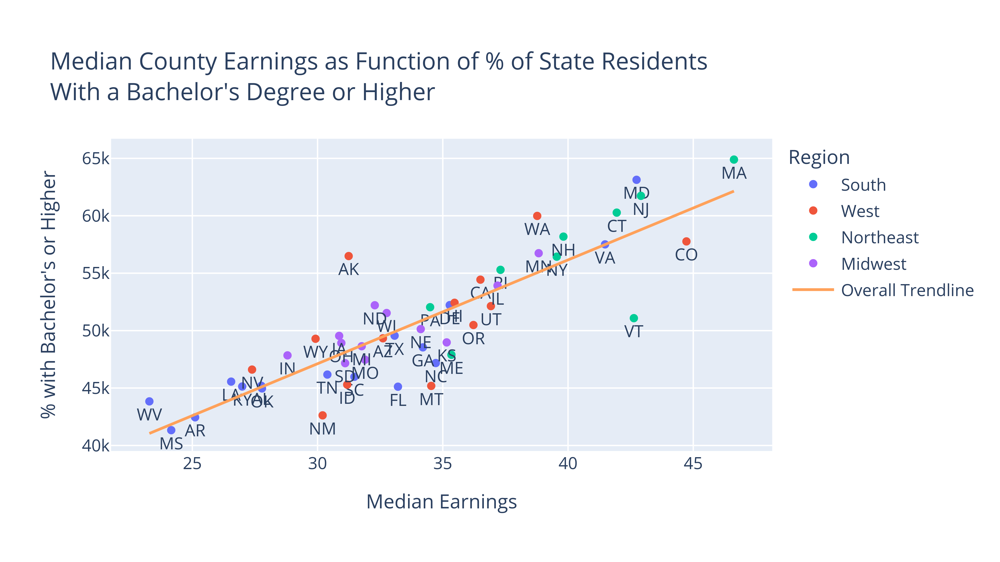

In [43]:
fig_smib_scatter = px.scatter(
    df_smib, x = "Pct_With_Bachelors_Degree", 
           y = 'Median_Earnings_for_Total_25plus_Population',
           color = 'Region', hover_data = 'NAME',
    text = 'State_Abbrev', trendline = 'ols', trendline_scope = 'overall',
    title = "Median County Earnings as Function of % of State \
Residents<br>With a Bachelor's Degree or Higher").update_layout(
    xaxis_title = 'Median Earnings', yaxis_title = "% with Bachelor's \
or Higher").update_traces(
    textposition = 'bottom center')


# trendline_scope = 'overall' instructs Plotly to plot a single trendline
# rather than one for each region. This code was based on the example
# found at https://plotly.com/python/linear-fits/ .

# 'textposition = bottom center' argument allows us to move our dot labels
# just below their corresponding dots, thus making them a bit more 
# readable.
# For more on scatter plot updates, see
# https://plotly.com/python/line-and-scatter/ 


wadi(fig_smib_scatter, 'Charts/state_ba_pct_earnings_scatter',
     display_type = display_type)

To me, the relationship between our independent and dependent variables looks quite linear; however, I ultimately found that a squared version of the 'Pct_With_Bachelors_Degree' field ended up having higher predictive power than the non-squared version. The following cell creates that squared copy.

In [44]:
df_smib['Pct_With_Bachelors_Degree_Squared'] = (
    df_smib['Pct_With_Bachelors_Degree']**2)

### Performing a linear regression

First, we'll try building a regression model that includes bachelor's degree percentages; a squared version of this percentage; and our Region field.

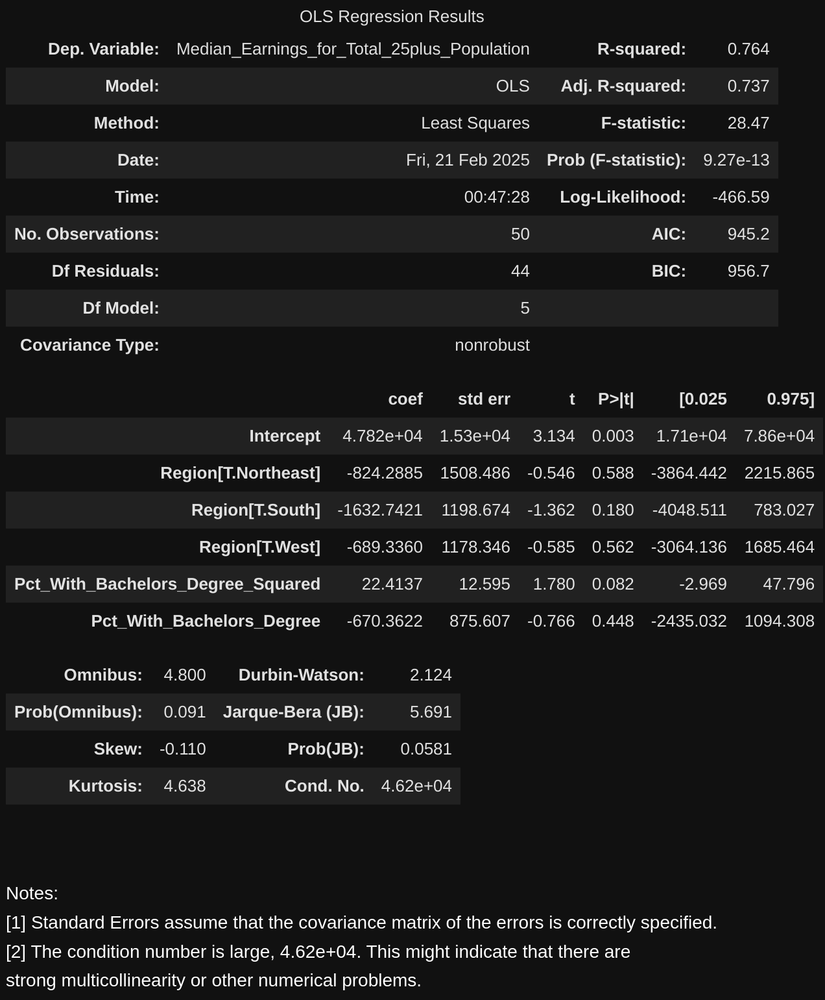

In [45]:
smib_lr_3 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree_Squared + \
Pct_With_Bachelors_Degree + Region",
    data = df_smib) 
smib_lr_results_3 = smib_lr_3.fit()
# smib_lr_results_1.summary()
Image('Regression_Screenshots/smib_lr_results_3_summary.png', width = 600)

Only the intercept is statistically significant! Is our model doomed? Not at all--we just need to reduce the number of predictors. Let's see what happens when we remove the 'Pct_With_Bachelors_Degree' predictor, as its p-value is far higher than its squared version:

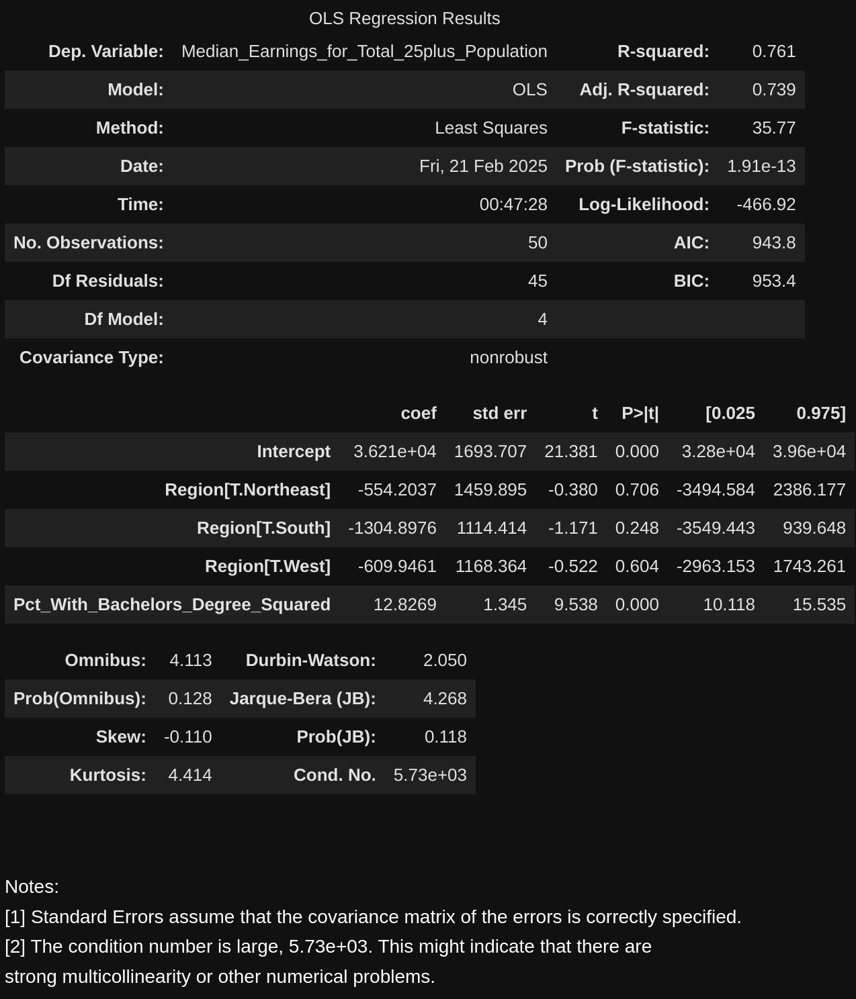

In [46]:
smib_lr_2 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree_Squared + Region",
    data = df_smib) 
smib_lr_results_2 = smib_lr_2.fit()
# smib_lr_results_2.summary()
Image('Regression_Screenshots/smib_lr_results_2_summary.png', width = 600)

The Pct_With_Bachelors_Degree_Squared field is now a statistically significant predictor. However, all of the 'Region' categories are still insignificant, so I'll go ahead and remove them. 

Keeping only the Pct_With_Bachelors_Degree_Squared predictor ended up increasing the adjusted R-squared of my regression. This metric is very useful when refining models, as it accounts for the number of independent variables that that model uses. If you find that adding a certain independent variable causes your adjusted R-squared to decrease, you *may* want to remove it.

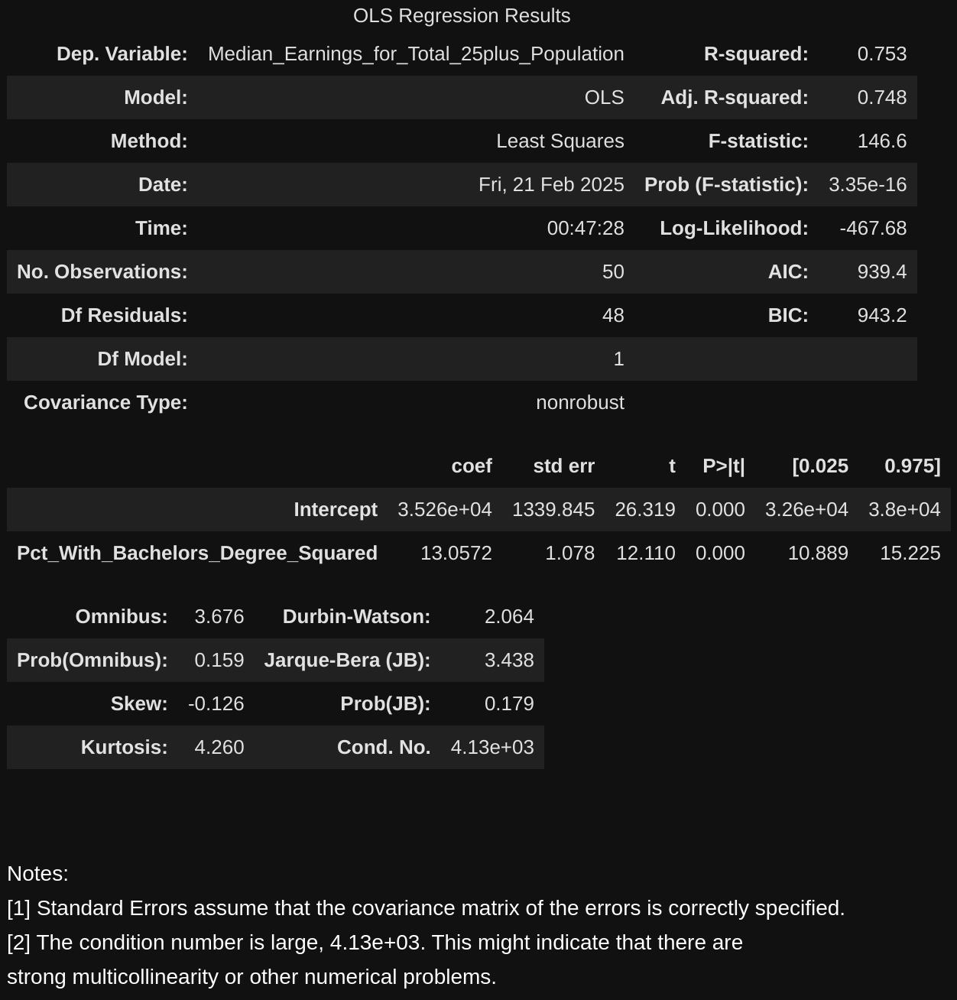

In [47]:
smib_lr_1 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree_Squared",
    data = df_smib) 
smib_lr_results_1 = smib_lr_1.fit()
# smib_lr_results_1.summary()
Image('Regression_Screenshots/smib_lr_results_1_summary.png', width = 600)

Next, we'll compare our model's predictions to actual median earnings.

In [48]:
df_smib_pred_vs_actual = df_smib.copy()[
['NAME', 'Median_Earnings_for_Total_25plus_Population',
 'Pct_With_Bachelors_Degree_Squared', 'Region', 'State_Abbrev']]
df_smib_pred_vs_actual.insert(1, 'Pred_Val', smib_lr_results_1.fittedvalues)
df_smib_pred_vs_actual.insert(1, 'Actual-Pred', smib_lr_results_1.resid)

Here are the five states that had the highest earnings relative to our model's predictions: (Alaska and North Dakota may appear here due to their oil and gas industry, which could provide higher-paying jobs for non-college grads.)

In [49]:
df_smib_pred_vs_actual.sort_values(
    'Actual-Pred', ascending = False).head(5)

,NAME,Actual-Pred,Pred_Val,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree_Squared,Region,State_Abbrev
1,Alaska,8483.325552,48008.674448,56492,976.079786,West,AK
47,Washington,5096.231011,54890.768989,59987,1503.152620,West,WA
20,Maryland,4021.565354,59111.434646,63133,1826.396975,South,MD
34,North Dakota,3334.522903,48873.477097,52208,1042.311655,Midwest,ND
30,New Jersey,2429.788162,59306.211838,61736,1841.314202,Northeast,NJ


And here are the 5 states with the *lowest* earnings relative to our predictions. (The first three 3 states here are relatively rural, so it's possible that they have fewer high-paying jobs for bachelor's degree holders. Again, though, this is just a guess.)

In [50]:
df_smib_pred_vs_actual.sort_values(
    'Actual-Pred').head(5)

,NAME,Actual-Pred,Pred_Val,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree_Squared,Region,State_Abbrev
45,Vermont,-7906.384818,58991.384818,51085,1817.202826,Northeast,VT
26,Montana,-5654.293537,50840.293537,45186,1192.942470,West,MT
31,New Mexico,-4552.923887,47173.923887,42621,912.149489,West,NM
9,Florida,-4547.900210,49664.900210,45117,1102.923670,South,FL
33,North Carolina,-3828.634015,51004.634015,47176,1205.528668,South,NC


Finally, we'll compare each state's predicted earnings to its actual earnings; create a histogram of our residuals; and then apply statsmodels' `omni_normtest()` function to gauge the normality of those residuals.

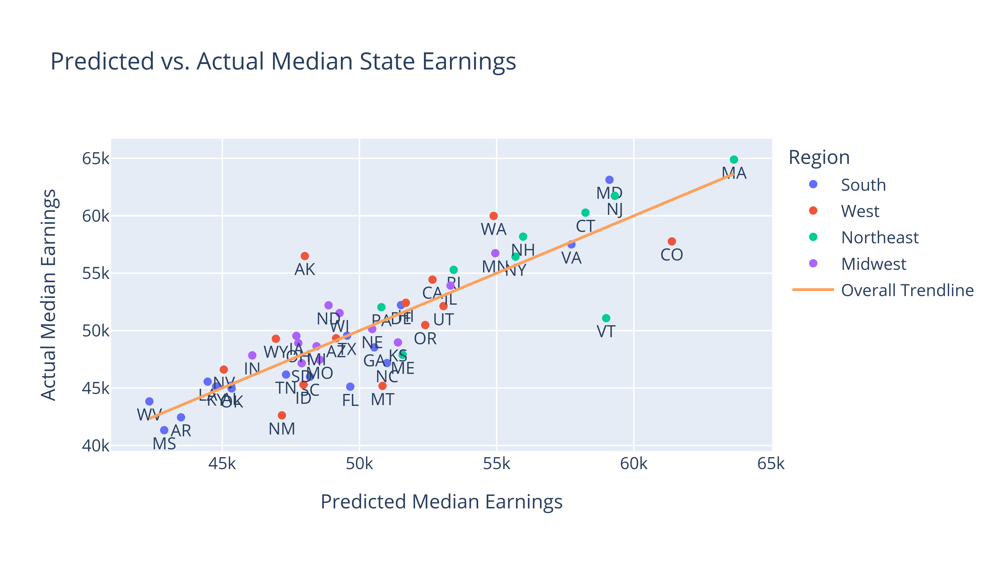

In [51]:
fig_smib_pred_vs_actual = px.scatter(
    df_smib_pred_vs_actual, x = 'Pred_Val', 
           y = 'Median_Earnings_for_Total_25plus_Population',
    color = 'Region', hover_data = 'NAME', text = 'State_Abbrev',
    title = "Predicted vs. Actual Median State Earnings",
trendline = 'ols', trendline_scope = 'overall').update_layout(
    xaxis_title = 'Predicted Median Earnings', 
    yaxis_title = 'Actual Median Earnings').update_traces(
    textposition = 'bottom center')

wadi(fig_smib_pred_vs_actual, 'Charts/smib_pred_vs_actual',
     display_type=display_type)

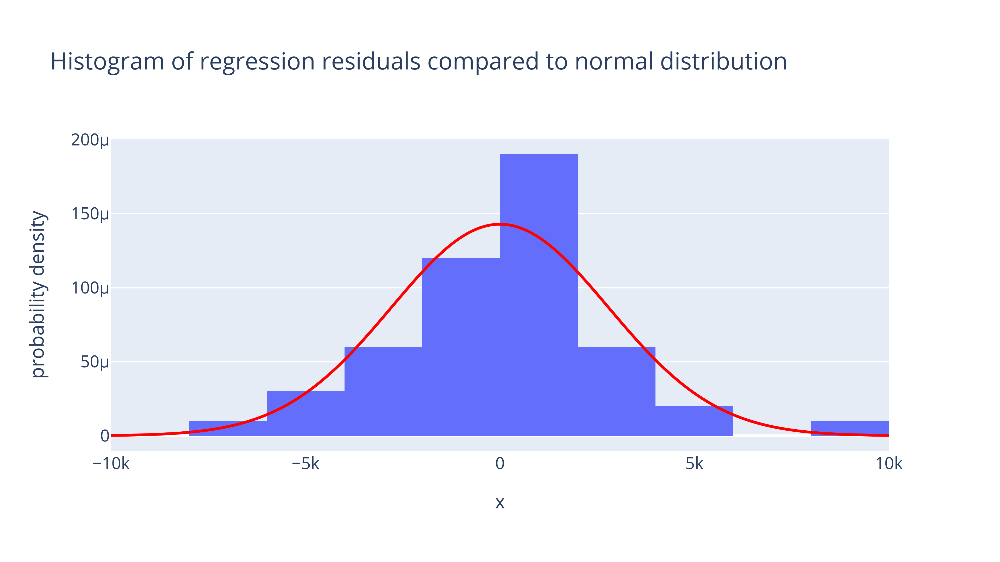

In [52]:
fig_smib_hist = px.histogram(
    x = smib_lr_results_1.resid,
title = 'Histogram of regression residuals compared to \
normal distribution',
histnorm = 'probability density')

fig_smib_hist.add_trace(
    px.line(gen_normdist(
    min = -10000, max = 10000, rows = 1000,
    mean = 0, stdev = np.std(smib_lr_results_1.resid)),
       x = 'x', y = 'y', color_discrete_sequence = ['red'])['data'][0])


wadi(fig_smib_hist, 'Charts/smib_residual',
     display_type=display_type)

Although this histogram appears to diverge from our normal distribution also, our p-value from the following `omni_normtest()` is above 0.05. My guess is that this p-value is higher than that for our county-level omni_normtest simply because our sample size is smaller.

In [53]:
sms.omni_normtest(
    smib_lr_results_1.resid)

NormaltestResult(statistic=np.float64(3.6759444784110493), pvalue=np.float64(0.15913979659171434))

### Comparing median earnings for different education levels

We have pretty strong evidence that, as the percentage of a county or state's population that has a bachelor's degree increases, the median income for that county also increases. However, that doesn't prove that bachelor's degree holders actually earn more than high-school-degree holders. Therefore, we'll now use descriptive statistics, visualizations, and linear regressions to compare earnings for different education levels directly.

First, we'll import national-level median earnings data for different education levels. (This data, like the state- and county-level data, was retrieved via Census Data Imports.)

In [54]:
df_nmib = pd.read_csv(
    '../Census_Data_Imports/Datasets/education_and_earnings_national.csv')
df_nmib[median_earnings_cols]

,Median_Earnings_for_Total_25plus_Population,Median_Earnings_Less_Than_HS,Median_Earnings_HS,Median_Earnings_Some_College,Median_Earnings_Bachelors_Degree,Median_Earnings_Postgraduate
0,51184,31492,38789,45840,67849,88719


Using this national-level dataset, we can see that the median income for college graduates was nearly 30,000 higher than that for high school graduates:

In [55]:
df_nmib['Median_Earnings_Bachelors_Degree'] - df_nmib['Median_Earnings_HS']

0    29060
dtype: int64

We could stop here, but I think it's still worth investigating the differences between bachelor's and high-school-diploma earnings (and those for other education categories) at the county level. For instance, we might find that the earnings advantage that comes with a bachelor's degree is particularly high (or low) in certain parts of the country.

In order to compare these stats by county, we'll first create a filtered copy of our county-level earnings data that does not contain any rows with invalid median income values. (These rows could interfere with our regression analyses.)

In [56]:
df_cmib_ec = df_cmib.copy() 
# ec = 'earnings_comparison'

# Removing all rows with negative median earnings values, which we'll
# assume are invalid (though negative earnings are indeed possible
# at the personal level)

for col in median_earnings_cols:
    df_cmib_ec.query(f'`{col}` >= 0', inplace = True)

# The following code creates a new set of columns that determines
# the percentage change in median earnings between certain educational
# attainment categories.

for df in [df_nmib, df_cmib_ec]:

    df['Pct_Median_Earnings_Increase_non_HS_to_HS'] = (
    100*(df['Median_Earnings_HS'] / 
         df['Median_Earnings_Less_Than_HS'] - 1))
    
    df['Pct_Median_Earnings_Increase_HS_to_Bachelors'] = (
    100*(df['Median_Earnings_Bachelors_Degree'] / 
         df['Median_Earnings_HS'] - 1))
    
    df['Pct_Median_Earnings_Increase_Bachelors_to_Postgraduate'] = (
    100*(df['Median_Earnings_Postgraduate'] / 
         df['Median_Earnings_Bachelors_Degree'] - 1))
    
    df['Pct_Median_Earnings_Increase_HS_to_Postgraduate'] = (
    100*(df['Median_Earnings_Postgraduate'] / 
         df['Median_Earnings_HS'] - 1))

We're now ready to compare earnings by education level at both the national and county level.

In [57]:
df_national_earnings_by_ed_level = df_nmib[median_earnings_cols].transpose(
).reset_index().rename(
    columns = {'index':'Category', 0:'Median Earnings'})

# The following code uses both str.replace() and replace() to 
# convert the education levels in the Category field to a more concise
# and readable format.
df_national_earnings_by_ed_level['Education Level'] = (
    df_national_earnings_by_ed_level['Category'].str.replace(
    'Median_Earnings_', '').str.replace('_',' ')).replace(
        {'for Total 25plus Population':'Total 25+ Population',
        'Bachelors Degree':"Bachelor's"})
df_national_earnings_by_ed_level

,Category,Median Earnings,Education Level
0,Median_Earnings_for_Total_25plus_Population,51184,Total 25+ Population
1,Median_Earnings_Less_Than_HS,31492,Less Than HS
2,Median_Earnings_HS,38789,HS
3,Median_Earnings_Some_College,45840,Some College
4,Median_Earnings_Bachelors_Degree,67849,Bachelor's
5,Median_Earnings_Postgraduate,88719,Postgraduate


From this table alone, we can see stark differences in median earnings by education level. We can also compare these earnings using a bar chart:

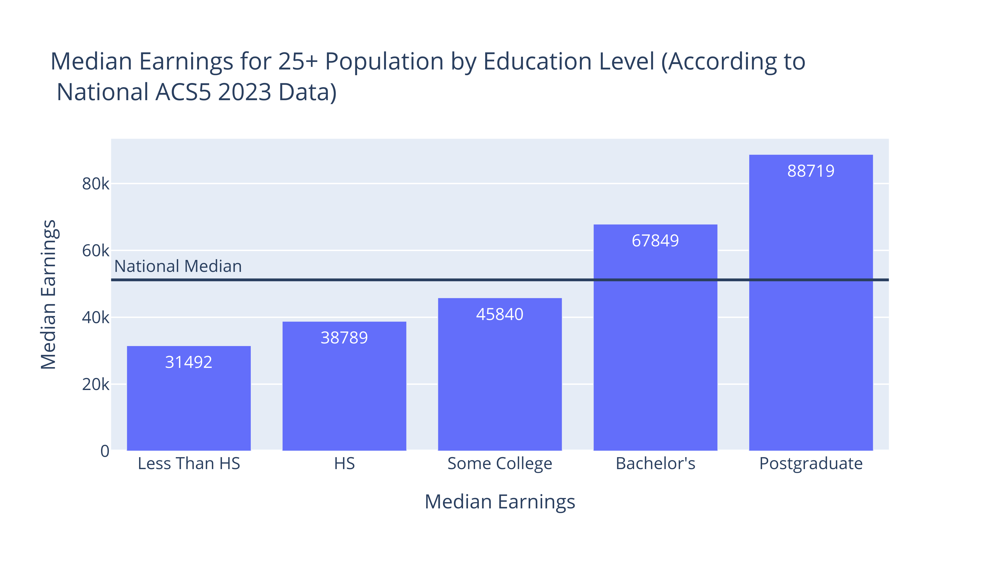

In [58]:
fig_national_median_earnings = px.bar(
    df_national_earnings_by_ed_level.query(
    "Category != 'Median_Earnings_for_Total_25plus_Population'"), 
       x = 'Education Level', y = 'Median Earnings', text_auto = '.0f',
      title = 'Median Earnings for 25+ Population by Education Level \
(According to<br> National ACS5 2023 Data)').update_layout(
    xaxis_title = 'Median Earnings')

# Adding a horizontal line to represent the national median income--along
# with an annotation to clarify to the reader that their monitor is not
# glitching out!
# https://plotly.com/python/horizontal-vertical-shapes/
fig_national_median_earnings.add_hline(
    y = df_national_earnings_by_ed_level.query("Category == \
'Median_Earnings_for_Total_25plus_Population'").iloc[0][
    'Median Earnings'], annotation_text = 'National Median',
annotation_position = 'top left')
wadi(fig_national_median_earnings, 'Charts/national_median_earnings',
     display_type=display_type)

Each of these educational categories is separated by thousands of dollars in median earnings. The largest gaps are between (1) the 'Some College' and 'Bachelor's' categories and (2) the 'Bachelor's' and 'Postgraduate' categories.

Even this data doesn't *prove* that a bachelor's degree will increase one's earnings power. For instance, it's possible that the people who choose to enroll in bachelor's and postgraduate programs would still have earned more than other high school graduates if they never pursued higher education. 

In order to make a particularly strong case for the financial benefits of a college degree, you would want to set up a randomized trial that helps some participants, but not others, graduate from college. (For instance, you could randomly assign college scholarships to half of a group of high-school graduates who weren't otherwise planning to get a bachelor's degree, then see if their earnings ultimately outpaced the other students in that group.) However, such a study is beyond the scope of this section!

Interestingly, when we evaluate median county-level earnings for each of our educational categories, we find *lower* values for higher education levels:

In [59]:
# Finding the median income for each education level within our county
# medians dataset (the medians of our medians, if you will):

df_county_earnings_by_ed_level = df_cmib_ec[median_earnings_cols].median(
).reset_index().rename(
    columns = {'index':'Category', 0:'Median Earnings'})

# I could have used the same replace()/str.replace() function shown
# within the national median earnings dataset to create our 
# 'Education Level' column, but for comparison purposes, I'll instead
# use Series.map():
df_county_earnings_by_ed_level['Education Level'] = (
    df_county_earnings_by_ed_level['Category'].map(
        {'Median_Earnings_for_Total_25plus_Population':
         'Total 25+ Population',
    'Median_Earnings_Less_Than_HS':'Less Than HS',
    'Median_Earnings_HS':'HS',
    'Median_Earnings_Some_College':'Some College',
    'Median_Earnings_Bachelors_Degree':"Bachelor's",
    'Median_Earnings_Postgraduate':'Postgraduate'}
    ))

df_county_earnings_by_ed_level

,Category,Median Earnings,Education Level
0,Median_Earnings_for_Total_25plus_Population,43831.0,Total 25+ Population
1,Median_Earnings_Less_Than_HS,31706.0,Less Than HS
2,Median_Earnings_HS,37525.0,HS
3,Median_Earnings_Some_College,42494.0,Some College
4,Median_Earnings_Bachelors_Degree,55859.0,Bachelor's
5,Median_Earnings_Postgraduate,69258.0,Postgraduate


In order to compare national and county-level medians side by side, we can add both datasets to the same table (with a 'Type' column to help distinguish between them), then plot them within a grouped bar chart:

(I tried plotting two horizonal lines to reflect the county-level and national median earnings, but this caused the chart to appear cluttered. Therefore, I instead chose to represent these median earnings in bar form.)

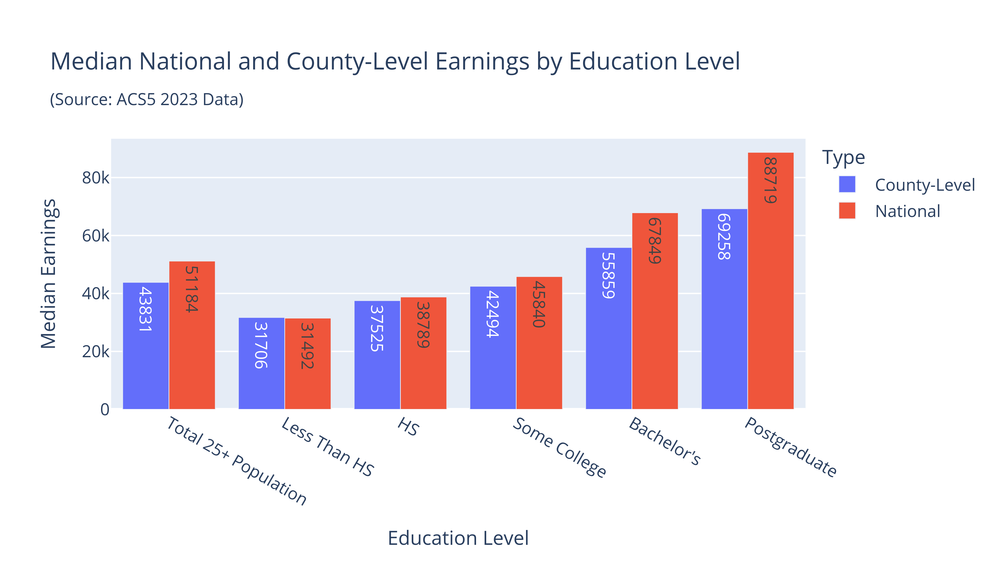

In [60]:
df_county_earnings_by_ed_level['Type'] = 'County-Level'
df_national_earnings_by_ed_level['Type'] = 'National'
df_county_vs_national_earnings_by_ed_level = pd.concat(
    [df_county_earnings_by_ed_level, df_national_earnings_by_ed_level])

# Note the use of <sub> in the following chart to create a subtitle.
# (sub actually stands for 'subscript,' not 'subtitle,' but it still
# works well for creating subtitles. You can also try <sup> as an 
# alternative.)
# I may have first learned about this technique from this response
# by InaMelloMood on StackOverflow:
# https://stackoverflow.com/a/68641333/13097194
fig_county_vs_national_median_earnings = px.bar(
    df_county_vs_national_earnings_by_ed_level, 
       x = 'Education Level', y = 'Median Earnings', text_auto = '.0f',
    color = 'Type',
      title = 'Median National and County-Level Earnings by Education \
Level<br><sub>(Source: ACS5 2023 Data)',
barmode = 'group')

wadi(fig_county_vs_national_median_earnings, 
     'Charts/county_vs_national_median_earnings',
     display_type=display_type)

For lower education levels, national median earnings come very close to the median county-level median earnings in our dataset. However, for higher education levels, the national median is considerably higher than the equivalent county-level median. This means that, while median bachelor's-degree earnings are 74.9% higher than high-school-diploma earnings at the national level, this difference goes down to 48.9% when we instead compare median county-level medians for these two groups. (See the following two cells for my percentage calculations.)

In [61]:
100 * (df_county_earnings_by_ed_level.query(
    "Category.str.contains('Bachelors')").iloc[0][
'Median Earnings'] / df_county_earnings_by_ed_level.query(
    "`Education Level` == 'HS'").iloc[0]['Median Earnings'] -1)

np.float64(48.8580946035976)

In [62]:
100 * (df_national_earnings_by_ed_level.query(
    "Category.str.contains('Bachelors')").iloc[0][
'Median Earnings'] / df_national_earnings_by_ed_level.query(
    "`Education Level` == 'HS'").iloc[0]['Median Earnings'] -1)

np.float64(74.91814689731623)

I find this discrepancy quite fascinating. One possible explanation is that people with bachelor's and postgraduate degrees tend to move to higher-earning counties after they graduate. These shifts would cause greater increases in our national-level medians, but they would have little or no impact within the median county-level medians shown in this graph.

### Exploring county-level differences between median high-school-diploma and bachelor's degree earnings

First, let's find the counties (and county equivalents) with 50,000 or more residents in which bachelor's-degree holders have the highest earnings advantage, in percentage terms, relative to high-school graduates: 

In [63]:
df_cmib_ec.query("Total_Population >= 50000").sort_values(
    'Pct_Median_Earnings_Increase_HS_to_Bachelors', 
                       ascending = False)[
['NAME', 'Pct_Median_Earnings_Increase_HS_to_Bachelors']].head(8)

,NAME,Pct_Median_Earnings_Increase_HS_to_Bachelors
2828,"Arlington County, Virginia",184.147394
224,"San Francisco County, California",169.921759
1860,"New York County, New York",166.556683
2917,"Alexandria city, Virginia",161.109609
321,"District of Columbia, District of Columbia",142.831086
229,"Santa Clara County, California",135.489613
2850,"Fairfax County, Virginia",132.574208
2874,"Loudoun County, Virginia",130.743637


5 of these 8 regions are in the Northern Virigina/DC area. Thus, the NVCU admissions team can point out to prospective applicants that a college degree *may* prove particularly lucrative in the NoVA area, where NVCU is located.

Meanwhile, here are the regions with 50K+ residents that had the *lowest* estimated increase in median earnings from a high-school diploma to a bachelor's degree:

In [64]:
df_cmib_ec.query("Total_Population >= 50000").sort_values(
    'Pct_Median_Earnings_Increase_HS_to_Bachelors')[
['NAME', 'Pct_Median_Earnings_Increase_HS_to_Bachelors']].head(5)

,NAME,Pct_Median_Earnings_Increase_HS_to_Bachelors
1767,"Carroll County, New Hampshire",9.674226
1224,"Franklin County, Massachusetts",13.896043
1115,"Acadia Parish, Louisiana",14.493175
2592,"Ector County, Texas",15.193989
2049,"Athens County, Ohio",16.409321


Those who choose not to go to college may be particularly interested in the following table, which shows shows counties with particularly strong median high-school-diploma earnings. My guess, as before, is that lucrative oil and/or natural gas extraction jobs explain many of these medians. 

In [65]:
df_cmib_ec.sort_values('Median_Earnings_HS', ascending = False)[
['NAME', 'Total_Population', 'Median_Earnings_HS']].head(8)

,NAME,Total_Population,Median_Earnings_HS
87,"North Slope Borough, Alaska",10891,88493
2966,"Garfield County, Washington",2326,68646
2772,"Winkler County, Texas",7540,67924
265,"Elbert County, Colorado",27152,62404
2018,"McKenzie County, North Dakota",14280,61058
2001,"Cavalier County, North Dakota",3663,60083
949,"Meade County, Kansas",3949,59145
93,"Southeast Fairbanks Census Area, Alaska",6936,59050


Meanwhile, the counties with the highest median college-graduate earnings tend to be located near DC or in California:

In [66]:
df_cmib_ec.sort_values(
    'Median_Earnings_Bachelors_Degree', ascending = False)[
['NAME', 'Total_Population', 'Median_Earnings_Bachelors_Degree']].head(8)

,NAME,Total_Population,Median_Earnings_Bachelors_Degree
2874,"Loudoun County, Virginia",427082,110960
224,"San Francisco County, California",836321,109016
229,"Santa Clara County, California",1903297,108483
75,"Dillingham Census Area, Alaska",4780,105104
207,"Marin County, California",258765,101238
227,"San Mateo County, California",745100,100853
2828,"Arlington County, Virginia",235463,98781
1465,"Sharkey County, Mississippi",3848,97500


Comparing median HS and bachelor's degree earnings: (counties above the regression line have higher-than-expected median bachelor's degree earnings relative to HS ones; for those below the line, the relationship is the opposite.)

You might also be wondering whether some correlation exists between median earnings for different education levels. For instance, do high-school-degree holder in counties with higher median earnings for college grads *also* have higher-than-usual earnings? 

We can explore this relationship via both a scatter plot and a regression. In order to do so, we'll first create a variant of df_cmib that includes only counties with 50K+ residents and excludes all rows with invalid median high-school or college-degree earnings: 

In [67]:
df_cmib_hs_bachelors_earnings = df_cmib.query(
    "Median_Earnings_HS != -666666666 \
& Median_Earnings_Bachelors_Degree != -666666666 & \
Total_Population >= 50000").copy()

As the following scatter plot shows, county-level high-school median earnings increase in a relatively linear fashion with college-degree earnings.

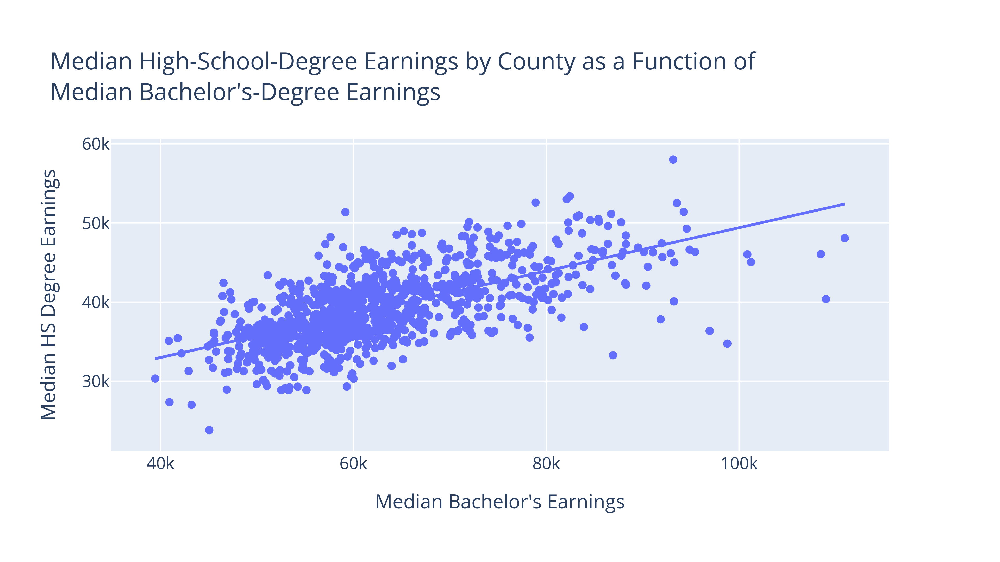

In [68]:
fig_hs_vs_bachelors_earnings = px.scatter(
    df_cmib_hs_bachelors_earnings, 
    x = 'Median_Earnings_Bachelors_Degree',
           y = 'Median_Earnings_HS',
          trendline = 'ols', hover_data = 'NAME',
title = "Median High-School-Degree Earnings by County as a Function \
of<br>Median Bachelor's-Degree Earnings").update_layout(
    xaxis_title = "Median Bachelor's Earnings", 
    yaxis_title = "Median HS Degree Earnings")
                                   
wadi(fig_hs_vs_bachelors_earnings, 'Charts/hs_bachelors_earnings_scatter',
    display_type=display_type)

As the following regression shows, variation in bachelor's-degree earnings accounts for around 41% of the variation in high-school degree earnings among counties with 50,000 or more residents. (It's worth noting, though, that when I ran this regression on *all* counties with valid data, regardless of population, the R-squared decreased to 15.7%--and when I modified it to include *only* counties with fewer than 50,000 residents, it sank to just 8.4%.

This model's intercept predicts that a hypothetical county in which *no one's* highest education level is a bachelor's degree will have median high-school-diploma earnings of 22,070. Meanwhile, the bachelor's-degree coefficient reports that each dollar increase in earnings for college grads is associated with an increase in median income of around 27 cents for high-school-degree holders.

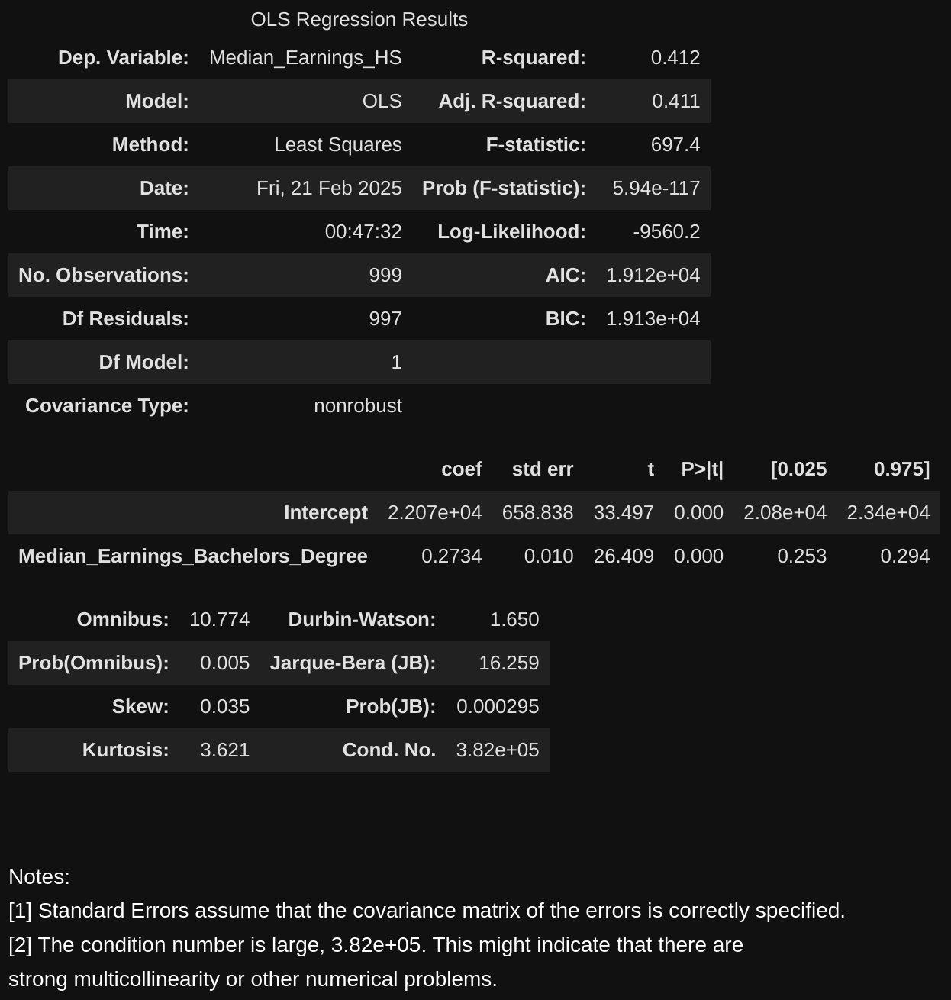

In [69]:
hs_vs_bachelors_lr_results = smf.ols(
    formula = "Median_Earnings_HS ~ Median_Earnings_Bachelors_Degree", 
    data = df_cmib_hs_bachelors_earnings)
hs_vs_bachelors_lr_results = hs_vs_bachelors_lr_results.fit()
# hs_vs_bachelors_lr_results.summary()
Image('Regression_Screenshots/hs_vs_bachelors_lr_results_summary.png', 
      width = 600)

### Exploring differences in median county-level earnings by education level

Earlier in this section, we saw that, on average, median county-level earnings for higher education levels outpace those for lower education levels. In order to figure out whether these differences are significant, we can implement--you guessed it!--a regression analysis.

In order to prepare for this regression, we'll use Pandas' powerful `melt()` function (https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.melt.html) to create a modified version of our county-earnings DataFrame in which all education levels are stored within a single column. We can then treat that column as a single independent variable.

In the following `melt()` function call, `id_vars` specifies the identifying variable(s) that we wish to associate with each new row; in this case, we'll choose our county names column (along with our population column, which will allow us to more easily perform regressions on counties with particular population sizes). Passing our median earnings colunms to `value_vars` will allow us to 'melt' them into a single column. `var_name` will store the new name of this melted column, and `value_name` will store the name of this column's corresponding values. 

In [70]:
df_county_earnings_melt = df_cmib.melt(
    id_vars= ['NAME', 'Total_Population'], value_vars=[
        'Median_Earnings_Less_Than_HS',
        'Median_Earnings_HS', 
        'Median_Earnings_Some_College',
        'Median_Earnings_Bachelors_Degree',
        'Median_Earnings_Postgraduate'], var_name = 'Education Level', 
             value_name = 'Median Earnings').sort_values(
    'NAME').query("`Median Earnings` != -666666666").reset_index(drop=True)
df_county_earnings_melt['Education Level'] = (df_county_earnings_melt[
    'Education Level'].str.replace('Median_Earnings_','').str.replace(
        '_',' ').str.replace('Bachelors',"Bachelor's").copy())

# Creating an integer-based sort column that can be used to sort
# graph entries more logically:
df_county_earnings_melt['Ed_Sort_Map'] = df_county_earnings_melt[
'Education Level'].map({'Less Than HS':0,'HS':1,
                        'Some College':2,
                        "Bachelor's Degree":3,
                        'Postgraduate':4})
df_county_earnings_melt.sort_values('Ed_Sort_Map', inplace = True)


Here's a look at this 'melted' DataFrame for a single county:

In [71]:
df_county_earnings_melt.query(
    "NAME == 'Albemarle County, Virginia'")

,NAME,Total_Population,Education Level,Median Earnings,Ed_Sort_Map
148,"Albemarle County, Virginia",113683,Less Than HS,28087,0
146,"Albemarle County, Virginia",113683,HS,41402,1
144,"Albemarle County, Virginia",113683,Some College,48340,2
147,"Albemarle County, Virginia",113683,Bachelor's Degree,65503,3
145,"Albemarle County, Virginia",113683,Postgraduate,91670,4


Compare this output to our original median earinngs data within df_cmib. All median earnings for specific education levels haev now been 'melted' into a single column; previously, they existed within separate columns.

In [72]:
df_cmib.query(
    "NAME == 'Albemarle County, Virginia'")[
median_earnings_cols]

,Median_Earnings_for_Total_25plus_Population,Median_Earnings_Less_Than_HS,Median_Earnings_HS,Median_Earnings_Some_College,Median_Earnings_Bachelors_Degree,Median_Earnings_Postgraduate
2823,61032,28087,41402,48340,65503,91670


### Visualizing county medians by education level

We can try visualizing the effect of degree type on median earnings via a scatter plot, but since our categorical independent variable only has a few levels, this chart will be challenging to interpret:

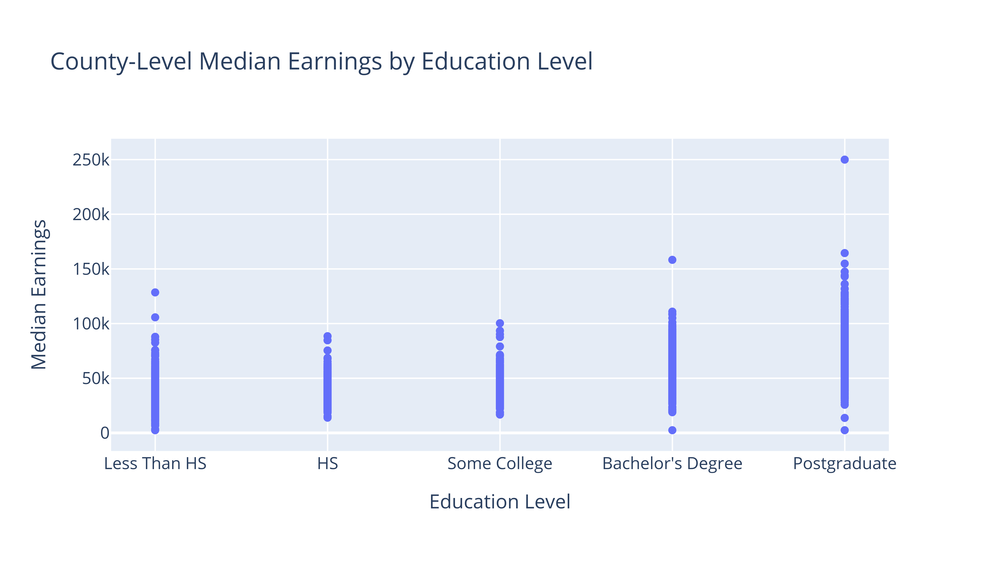

In [73]:
fig_county_earnings_scatter = px.scatter(
    df_county_earnings_melt, 
           x = 'Education Level', y = 'Median Earnings',
          hover_data = 'NAME', title = "County-Level Median Earnings by \
Education Level")
wadi(fig_county_earnings_scatter, 
     'Charts/county_earnings_scatter',
    display_type = display_type)

A better option will be to create a grouped histogram: (Note: to make the histogram a bit clearer, I'll filter out bars that represent median earnings above 100,000.)

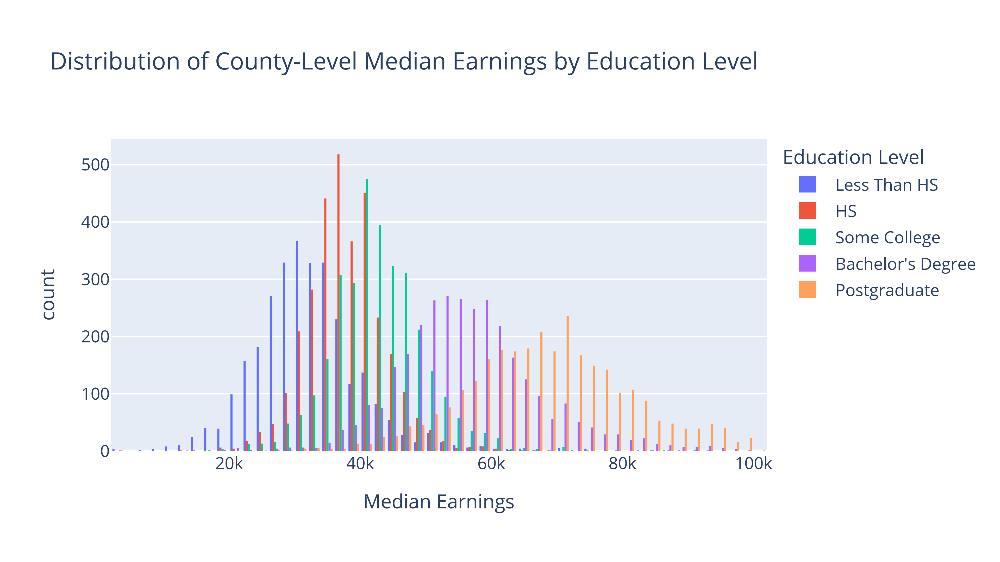

In [74]:
fig_county_earnings_hist = px.histogram(
    df_county_earnings_melt.query("`Median Earnings` <= 100000"), 
    x = 'Median Earnings', color = 'Education Level', barmode = 'group',
title = "Distribution of County-Level Median Earnings by Education Level", 
    nbins = 80)
# nbins helps control the level of detail featured in our histogram.
# For more on this variable, see
# https://plotly.com/python/histograms/
    
wadi(fig_county_earnings_hist, 
     'Charts/hs_bachelors_earnings_hist', display_type = display_type)

I'll admit that this isn't the clearest chart either; however, it does reveal notable differences in the shapes and locations of each education level's distribution. For instance, though there's some overlap between the two, the 'HS' category is far to the left of the 'Bachelor's Degree' category, which in turn is located to the left of the 'Postgraduate' category. In addition, the 'HS' bars appear more concentrated than do the 'Postgraduate' bars, which are quite spread out. (I imagine that this is because there are fewer postgraduate-degree holders in the US; as a result, their median county-level earnings may be more varied due to their smaller sample size.)

### Evaluating median earnings differences via a regression model

We'll now use a linear regression to explore whether the differences in county-level median earnings between bachelor's degree holders and other education levels are statistically significant.

(Becuase the 'Median Earnings' field has a space in it, we need to use `Q()`, a function of the patsy library that helps power statsmodels' formula functionality, to correctly parse it. For more on this function, see https://patsy.readthedocs.io/en/latest/builtins-reference.html#patsy.builtins.Q)

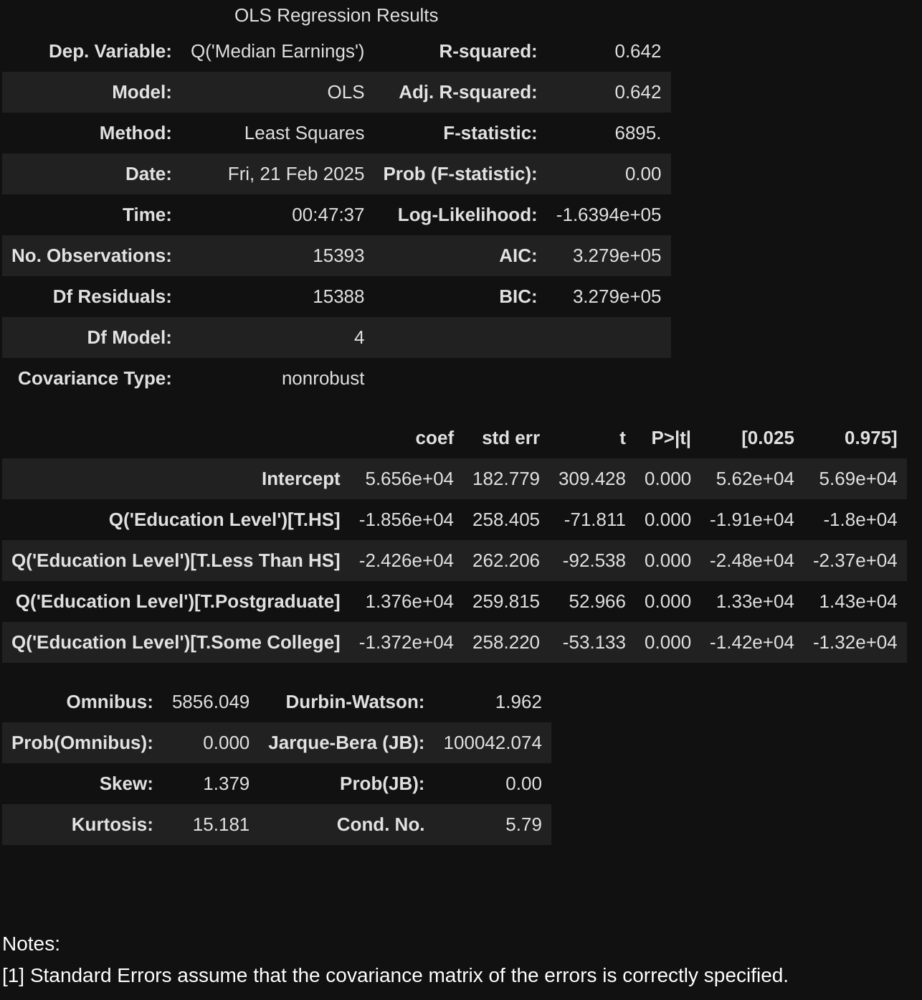

In [75]:
county_ed_level_earnings_lr_1 = smf.ols(
    formula = "Q('Median Earnings') ~ Q('Education Level')", 
    data = df_county_earnings_melt) 
county_ed_level_earnings_lr_1_results = county_ed_level_earnings_lr_1.fit()
# county_ed_level_earnings_lr_1_results.summary()
Image('Regression_Screenshots/county_ed_level_earnings_lr_1_\
results_summary.png', width = 600)

Note that this model compares each education level to one specific baseline, which in this case happens to be the median income for bachelor's-degree holders. Thus, each coefficient specifies how much higher, or lower, we can expect a given median income to be relative to that for college graduates. All of these coefficients are statistically significant (with p-values below 0.05); in addition, our R-squared value shows that roughly two thirds of the variation in median incomes can be explained by these education categories.

If you wanted to compare two other medians (such as those for non-high-school graduates and high school graduates), you could do so by creating a separate regression model whose data source includes only those two categories:

In [76]:
# Specifying which categories to compare:
levels_to_compare = ['Less Than HS', 'HS']

Running a regression that evaluates differences in median county-level incomes for non-HS grads and HS grads:

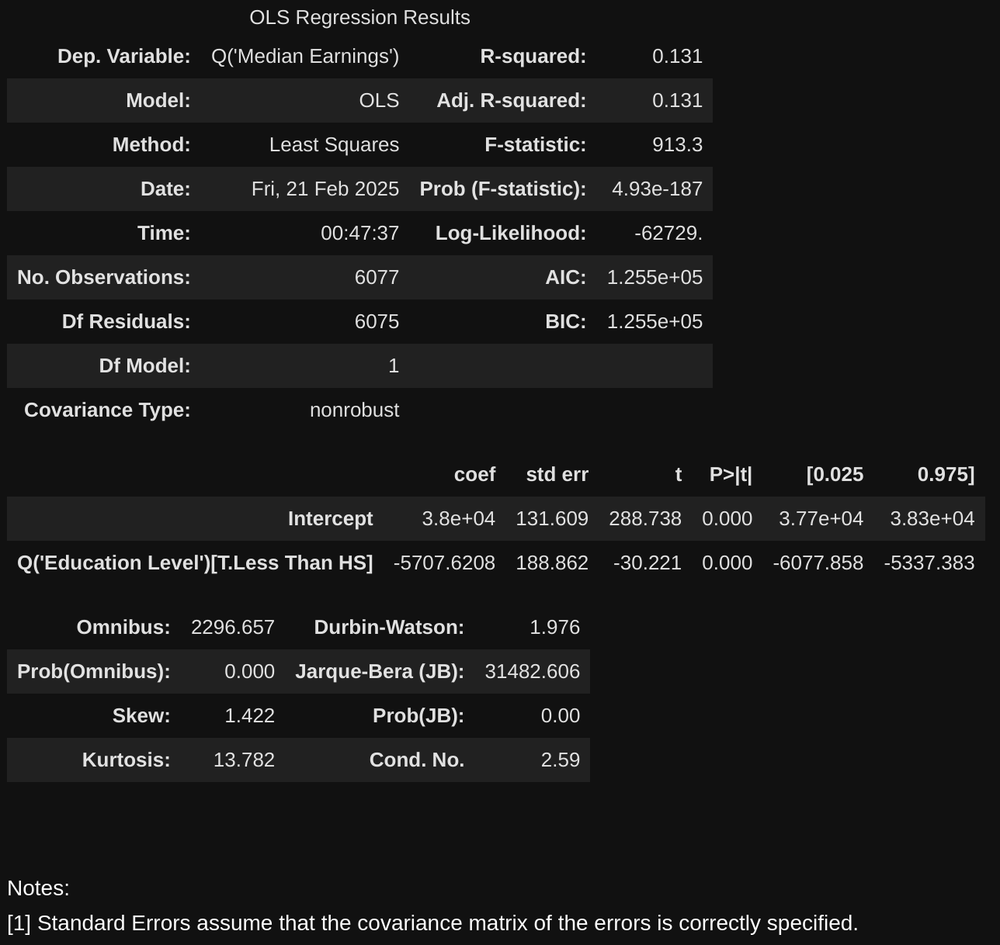

In [77]:
county_ed_level_earnings_lr_2 = smf.ols(
    formula = "Q('Median Earnings') ~ Q('Education Level')", 
    data = df_county_earnings_melt.query(
        "`Education Level` in @levels_to_compare"))
county_ed_level_earnings_lr_2_results = county_ed_level_earnings_lr_2.fit()
# county_ed_level_earnings_lr_2_results.summary()
Image('Regression_Screenshots/county_ed_level_earnings_lr_2_\
results_summary.png', width = 600)

This model shows that median county-level earnings for high school graduates are around 5,700 higher than those who didn't graduate high school; this difference is statistically significant.

## Part 3: A word of caution regarding significance testing

We've done quite a few regression models in this section; similarly, in your own research, you might end up throwing lots of different regressions, or other significance tests, into the same notebook. However, it's worth keeping in mind that, the more tests you perform, *the greater your chance of committing a Type I error.* (A 'Type I error' is one in which you mistakenly conclude a result to be statistically significant.)

The following cell provides a rather extreme example of the risk of performing too many regression analyses. It performs 1,000 linear regressions of 1,000 different datasets, each of which has randomly-generated values for its independent and dependent variables. 

Because we're generating these variables at random, there shouldn't be any significant relationship between them. However, if we use a significance level of 0.05, there will, on average, be a 5% chance that we deem one of these randomly-generated patterns to be statistically significant--thus committing a Type I error.

In [78]:
rng = np.random.default_rng(seed = 214442)

pvals_list = [] # This list will store all of our p-values from our 
# regressions.
df_list = []

for i in range(1000):
    # Creating a DataFrame with randomly-generated and 
    # normally-distributed independent- and dependent-variable values:
    df_random = pd.DataFrame({'iv':rng.normal(
        loc = 50, scale = 5, size = 1000),
                  'dv':rng.normal(loc = 50, scale = 5, size = 1000)})
    # Running a regression to evaluate the relationship between our
    # independent and dependent variables, then adding the p-value
    # to our list of results:
    pvals_list.append(
        smf.ols(formula = "dv ~ iv", data = df_random).fit().pvalues['iv'])
    df_list.append(df_random)

# Converting this list into a Series: (we can then use the Series's 
# index values to find the DataFrame corresponding to a particular 
# p-value.)
s_pvals = pd.Series(pvals_list)

Here's our list of p-values, sorted from lowest to highest:

In [79]:
s_pvals.sort_values()

878    0.000239
788    0.003854
786    0.003956
217    0.004219
         ...   
200    0.996843
327    0.996902
49     0.998139
74     0.999707
Length: 1000, dtype: float64

Our four smallest p-values are all below 0.005, or less than one tenth our normal significance level. These results would strike most researchers as 'significant,' but in this case, they were purely due to chance.

It turns out that we found a 'significant' result within around 4.5% of our datasets (a percentage that comes pretty close to our 5% significance level):

In [80]:
print(f"{100* len([pval for pval in pvals_list if pval < 0.05]) 
/ len(pvals_list)}% of our simulated regressions produced 'significant' \
results, even though the data on which they were based was randomly \
generated.")

4.6% of our simulated regressions produced 'significant' results, even though the data on which they were based was randomly generated.


In your own work, of course, you probably won't be performing 1,000 regressions all at once. However, even if you're including a more modest number of significance tests in your research, it won't take long before you risk committing a Type I error.

The following code plots the likelihood that, in the course of performing 1 to 50 regressions, you will commit a Type I error:

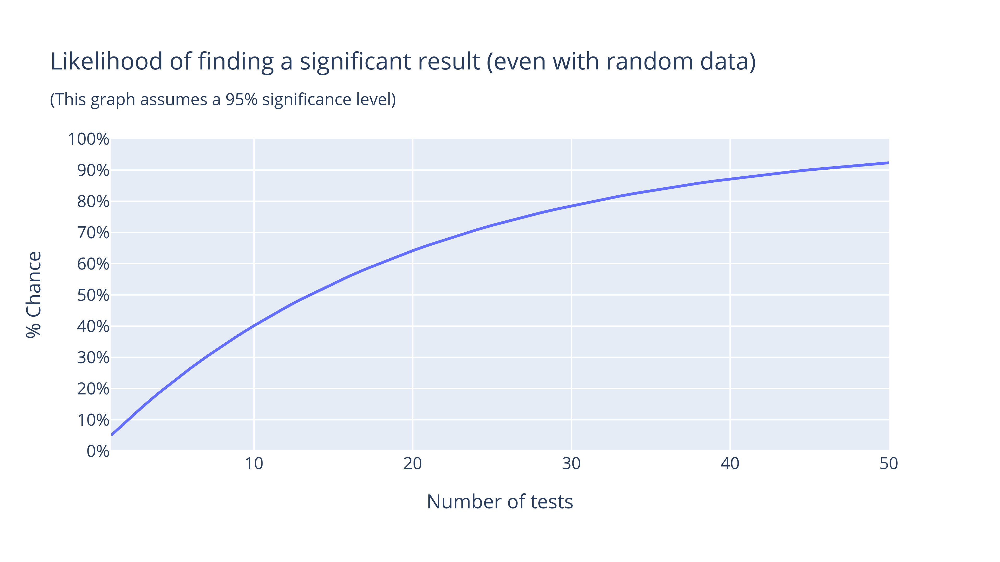

In [81]:
test_count = list(range(1, 51))
t1_error_odds = [1 - (1-0.05)**test_num for test_num in test_count]

fig_t1_error = px.line(x = test_count, y = t1_error_odds, 
title = 'Likelihood of \
finding a significant result (even with random data)<br><sub>\
(This graph assumes a 95% significance level)').update_layout(
    yaxis_tickformat = '.0%', xaxis_title = 'Number of tests',
yaxis_title = '% Chance', yaxis_dtick = 0.1, yaxis_range = [0, 1])

# yaxis_dtick allows us to specify the spacing in between ticks;
# yaxis_range lets us determine the lower and upper boundaries of our chart.
# For more on these two options,
# see https://plotly.com/python/reference/layout/yaxis/ . 

wadi(fig_t1_error, 'Charts/t1_error_odds', display_type=display_type)

As the chart demonstrates, you won't need to complete too many tests before the risk of a Type I error becomes substantial. If you perform five significance tests, your odds of a Type I error will be around 23%; and should you complete 14 tests, your odds of making a Type I error will have risen above 50%:

In [82]:
# Odds of committing a Type I error after 5 and 14 tests:
100*(1-0.95**5), 100*(1-0.95**14)

(22.621906250000023, 51.23250208844705)

What can be done about this issue of multiple comparisons (described in more detail at https://en.wikipedia.org/wiki/Multiple_comparisons_problem)? One option is to adjust your definition of a significant p-value by dividing it by the number of tests you're performing. For instance, if you perform 5 tests, you might choose to use a p value of 0.01 (0.05 / 5) rather than 0.05; if you perform 10 tests, you might choose to use a p value of just 0.005. This is an example of the Bonferroni correction (https://en.wikipedia.org/wiki/Bonferroni_correction). 

However, although this method is quite simple, I recommend looking into the Holm-Boneforroni method (https://en.wikipedia.org/wiki/Holm%E2%80%93Bonferroni_method) as an alternative, as this method helps reduce your likelihood of committing a Type II error (e.g. overlooking a result that actually *was* significant).

The following cell shows the likelihood of committing a Type I error if a Bonferroni correction has been applied.

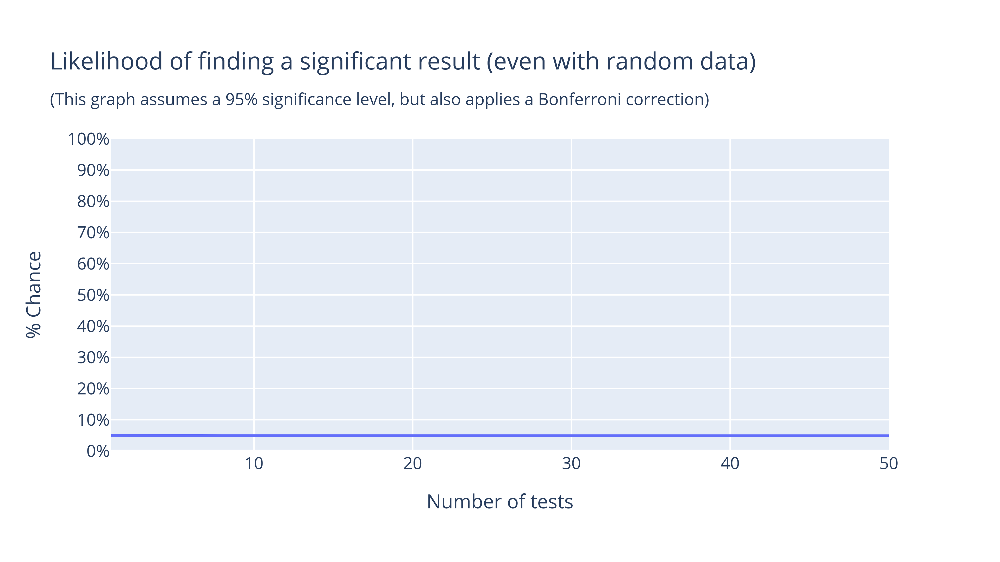

In [83]:
test_count = list(range(1, 51))

# The following calculation divides 0.05 (our threshold for a significant
# p-value) by the number of tests being carried out, thus
# helping reduce the risk of a Type I error.

t1_bc_error_odds = [1-((1-0.05/test_num)**test_num) 
                 for test_num in test_count]

fig_t1_error = px.line(x = test_count, y = t1_bc_error_odds, 
title = 'Likelihood of \
finding a significant result (even with random data)<br><sub>\
(This graph assumes a 95% significance level, but also applies \
a Bonferroni correction)').update_layout(
    yaxis_tickformat = '.0%', xaxis_title = 'Number of tests',
yaxis_title = '% Chance', yaxis_dtick = 0.1, yaxis_range = [0, 1])

# yaxis_dtick allows us to specify the spacing in between ticks;
# yaxis_range lets us determine the lower and upper boundaries of our chart.
# For more on these two options,
# see https://plotly.com/python/reference/layout/yaxis/ . 

wadi(fig_t1_error, 'Charts/t1_error_odds_bonferroni_correction', 
     display_type=display_type)

I do not mean to say here that you should always use a correction method to adjust your p-values within a given body of research. However, you might find that these tools help boost your confidence that a given p-value--or set of p-values--is statistically significant.

## Conclusion

In this section, we explored linear regression models for both simulated and real-world data. These models incorporated both categorical variables (like college, region, and education level) and continuous variables (like fall bookstore sales and the percentage of county residents with a bachelor's degree). We also discussed the concept of statistical significance along the way.

There is much, much more that we could have covered within this section. For instance, logistic regressions (https://www.statsmodels.org/stable/generated/statsmodels.formula.api.logit.html) are a useful tool for evaluating datasets whose dependent variable is boolean (e.g. 1 or 0 or True or False). In addition, we didn't get into the subject of refining a given model to make it as accurate as possible--or the risk of 'overfitting' a model to your data. My hope, however, is that this section will inspire you to continue studying--and applying--regressions in your own work.

